# 3D Multi-class Segmentation with UNETR  (Muscle, Fat (subcut and internal), psoas,Cavity,BGD)

## Setup environment

In [1]:
!pip install -q "monai-weekly[nibabel, tqdm, einops]"
!python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline

In [2]:
import os
import shutil
import tempfile

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

from monai.losses import DiceCELoss
from monai.inferers import sliding_window_inference
from monai.transforms import (
    AsDiscrete,
    EnsureChannelFirstd,
    AddChanneld,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandFlipd,
    RandCropByPosNegLabeld,
    RandShiftIntensityd,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    RandRotate90d,
    ToTensord,
)

from monai.config import print_config
from monai.metrics import DiceMetric
from monai.networks.nets import UNETR

from monai.data import (
    DataLoader,
    CacheDataset,
    load_decathlon_datalist,
    decollate_batch,
)


import torch

print_config()

MONAI version: 0.10.dev2231
Numpy version: 1.23.1
Pytorch version: 1.12.0+cu102
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 8236821c099e5997f7ad0410c5374e4472f4ed14
MONAI __file__: /home/adminbthomas/miniconda3/envs/PT02/lib/python3.9/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.9
Nibabel version: 4.0.1
scikit-image version: 0.19.3
Pillow version: 9.2.0
Tensorboard version: 2.9.1
gdown version: 4.5.1
TorchVision version: 0.13.0+cu102
tqdm version: 4.64.0
lmdb version: 1.3.0
psutil version: 5.9.1
pandas version: 1.4.3
einops version: 0.4.1
transformers version: 4.20.1
mlflow version: 1.27.0
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



## Setup data directory


In [3]:
# directory = os.environ.get("MONAI_DATA_DIRECTORY")
root_dir = "/home/adminbthomas/Downloads/ensemble/unetr"# root_dir = tempfile.mkdtemp() if directory is None else directory
print(root_dir)

/home/adminbthomas/Downloads/ensemble/unetr


## Setup transforms for training and validation

In [4]:
import datetime
import time

train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
#         AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 4.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=0,
            a_max=250,
            b_min=0.0,
            b_max=1.0,
            clip=False,   # change-intermedouts 
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(96, 96, 16),
            pos=1,
            neg=1,
            num_samples=4,
            image_key="image",
            image_threshold=0,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[0],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[1],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[2],
            prob=0.10,
        ),
        RandRotate90d(
            keys=["image", "label"],
            prob=0.10,
            max_k=3,
        ),
        RandShiftIntensityd(
            keys=["image"],
            offsets=0.10,
            prob=0.50,
        ),
        ToTensord(keys=["image", "label"]),
#         SaveImaged(keys="image", meta_keys="image_meta_dict", output_dir="./outMR02_Jul23_Interinputs", output_postfix=datetime.datetime.now().strftime('%f'), resample=False, separate_folder=False),
#         SaveImaged(keys="label", meta_keys="label_meta_dict", output_dir="./outMR02_Jul23_Interinputs", output_postfix=datetime.datetime.now().strftime('%f'), resample=False, separate_folder=False),
    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
#         AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 4.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"], a_min=0, a_max=250, b_min=0.0, b_max=1.0, clip=False
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        ToTensord(keys=["image", "label"]),
    ]
)

### DATA

In [5]:
data_dir = os.path.join(root_dir,"../data/")

In [6]:
split_JSON = "dataset_MR09fold3.json"
datasets = data_dir + split_JSON
datalist = load_decathlon_datalist(datasets, True, "training")
val_files = load_decathlon_datalist(datasets, True, "validation")
train_ds = CacheDataset(
    data=datalist,
    transform=train_transforms,
    cache_num=24,
    cache_rate=1.0,
    num_workers=8,
)
train_loader = DataLoader(
    train_ds, batch_size=1, shuffle=True, num_workers=8, pin_memory=True
)
val_ds = CacheDataset(
    data=val_files, transform=val_transforms, cache_num=6, cache_rate=1.0, num_workers=4
)
val_loader = DataLoader(
    val_ds, batch_size=1, shuffle=False, num_workers=4, pin_memory=True
)

Loading dataset:   0%|                                                                                                                                                       | 0/12 [00:00<?, ?it/s]Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Loading dataset: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  8.53it/s]


## Check data shape and visualize

image shape: torch.Size([1, 250, 176, 25]), label shape: torch.Size([1, 250, 176, 25])


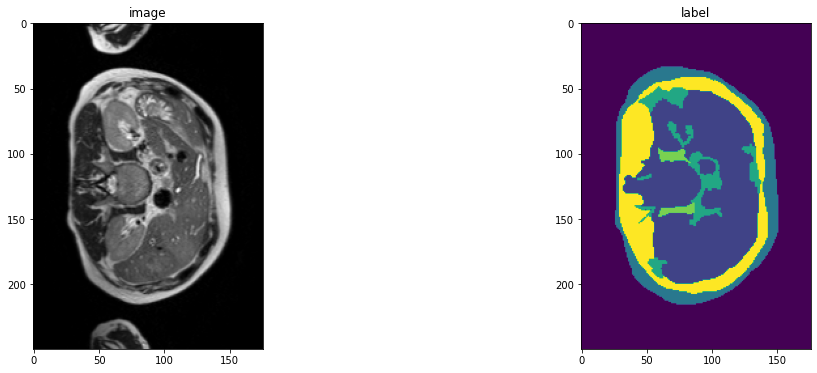

In [7]:
slice_map = {
    "A013_v1_T2W.nii.gz": 10,
    "A013_v1_T2W.nii.gz": 8,
    "A013_v1_T2W.nii.gz": 6
}
case_num = 1
img_name = os.path.split(val_ds[case_num]["image_meta_dict"]["filename_or_obj"])[1]
img = val_ds[case_num]["image"]
label = val_ds[case_num]["label"]
img_shape = img.shape
label_shape = label.shape
print(f"image shape: {img_shape}, label shape: {label_shape}")
plt.figure("image", (18, 6))
plt.subplot(1, 2, 1)
plt.title("image")
plt.imshow(img[0, :, :, slice_map[img_name]].detach().cpu(), cmap="gray")
plt.subplot(1, 2, 2)
plt.title("label")
plt.imshow(label[0, :, :, slice_map[img_name]].detach().cpu())
plt.show()

### Create Model, Loss, Optimizer


In [5]:
# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
device = torch.device("cuda:1")

model = UNETR(
    in_channels=1,
    out_channels=6,
    img_size=(96, 96, 16),
    feature_size=16,
    hidden_size=768,
    mlp_dim=3072,
    num_heads=12,
    pos_embed="perceptron",
    norm_name="instance",
    res_block=True,
    dropout_rate=0.0,
).to(device)

loss_function = DiceCELoss(to_onehot_y=True, softmax=True)
torch.backends.cudnn.benchmark = True
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

### Execute a typical PyTorch training process

In [9]:
def validation(epoch_iterator_val):
    model.eval()
    dice_vals = list()
    with torch.no_grad():
        for step, batch in enumerate(epoch_iterator_val):
            val_inputs, val_labels = (batch["image"].to(device), batch["label"].to(device))
            val_outputs = sliding_window_inference(val_inputs, (96, 96, 16), 4, model)
            val_labels_list = decollate_batch(val_labels)
            val_labels_convert = [
                post_label(val_label_tensor) for val_label_tensor in val_labels_list
            ]
            val_outputs_list = decollate_batch(val_outputs)
            val_output_convert = [
                post_pred(val_pred_tensor) for val_pred_tensor in val_outputs_list
            ]
            dice_metric(y_pred=val_output_convert, y=val_labels_convert)
            dice = dice_metric.aggregate().item()
            dice_vals.append(dice)
            epoch_iterator_val.set_description(
                "Validate (%d / %d Steps) (dice=%2.5f)" % (global_step, 10.0, dice)
            )
        dice_metric.reset()
    mean_dice_val = np.mean(dice_vals)
    return mean_dice_val


def train(global_step, train_loader, dice_val_best, global_step_best):
    model.train()
    epoch_loss = 0
    step = 0
    epoch_iterator = tqdm(
        train_loader, desc="Training (X / X Steps) (loss=X.X)", dynamic_ncols=True
    )
    for step, batch in enumerate(epoch_iterator):
        step += 1
        x, y = (batch["image"].to(device), batch["label"].to(device))
#         print(x.shape)
#         print(y.shape)
#         plt.figure("image", (18, 6))
#         plt.subplot(1, 2, 1)
#         plt.title("image")
#         plt.imshow(x[3,0,:,:,4].detach().cpu(), cmap="gray")
#         plt.subplot(1, 2, 2)
#         plt.title("label")
#         plt.imshow(y[3,0,:,:,4].detach().cpu())
#         plt.show()
        logit_map = model(x)
        loss = loss_function(logit_map, y)
        loss.backward()
        epoch_loss += loss.item()
        optimizer.step()
        optimizer.zero_grad()
        epoch_iterator.set_description(
            "Training (%d / %d Steps) (loss=%2.5f)" % (global_step, max_iterations, loss)
        )
        if (
            global_step % eval_num == 0 and global_step != 0
        ) or global_step == max_iterations:
            epoch_iterator_val = tqdm(
                val_loader, desc="Validate (X / X Steps) (dice=X.X)", dynamic_ncols=True
            )
            dice_val = validation(epoch_iterator_val)
            epoch_loss /= step
            epoch_loss_values.append(epoch_loss)
            metric_values.append(dice_val)
            if dice_val > dice_val_best:
                dice_val_best = dice_val
                global_step_best = global_step
                torch.save(
                    model.state_dict(), os.path.join(root_dir, "TestMR09_unetrensemble_fold3.pth")
                )
                print(
                    "Model Was Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
            else:
                print(
                    "Model Was Not Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
        global_step += 1
        
    return global_step, dice_val_best, global_step_best


max_iterations = 70000
eval_num = 250
post_label = AsDiscrete(to_onehot=6)
post_pred = AsDiscrete(argmax=True, to_onehot=6)
dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)
global_step = 0
dice_val_best = 0.0
global_step_best = 0
epoch_loss_values = []
metric_values = []
while global_step < max_iterations:
    global_step, dice_val_best, global_step_best = train(
        global_step, train_loader, dice_val_best, global_step_best
    )
#     print('I am waiting....')
#     time.sleep(1)
model.load_state_dict(torch.load(os.path.join(root_dir, "TestMR09_unetrensemble_fold3.pth")))

Training (251 / 70000 Steps) (loss=1.79702): 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.14it/s]

Model Was Saved ! Current Best Avg. Dice: 0.5562968055407206 Current Avg. Dice: 0.5562968055407206


Training (501 / 70000 Steps) (loss=1.46175):  83%|███████████████████████████████████████████████████████████████████████████████████████████████                   | 10/12 [00:03<00:01,  1.96it/s]

Model Was Saved ! Current Best Avg. Dice: 0.5904612342516581 Current Avg. Dice: 0.5904612342516581


Training (751 / 70000 Steps) (loss=1.34907):  67%|████████████████████████████████████████████████████████████████████████████▋                                      | 8/12 [00:03<00:02,  1.92it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6203516920407613 Current Avg. Dice: 0.6203516920407613


Training (1001 / 70000 Steps) (loss=0.96421):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.80it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6264590819676717 Current Avg. Dice: 0.6264590819676717


Training (1251 / 70000 Steps) (loss=0.91555):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.49it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6417057911554972 Current Avg. Dice: 0.6417057911554972


Training (1501 / 70000 Steps) (loss=1.02172):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.09s/it]

Model Was Saved ! Current Best Avg. Dice: 0.6499657034873962 Current Avg. Dice: 0.6499657034873962


Training (1751 / 70000 Steps) (loss=1.00207): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  2.02it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6570408940315247 Current Avg. Dice: 0.6570408940315247


Training (2001 / 70000 Steps) (loss=0.78977):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:01,  1.96it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6617933710416158 Current Avg. Dice: 0.6617933710416158


Training (2251 / 70000 Steps) (loss=0.99959):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.92it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6663237611452738 Current Avg. Dice: 0.6663237611452738


Training (2501 / 70000 Steps) (loss=1.09405):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.80it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6676300366719564 Current Avg. Dice: 0.6676300366719564


Training (2751 / 70000 Steps) (loss=1.12356):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.49it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6752678751945496 Current Avg. Dice: 0.6752678751945496


Training (3001 / 70000 Steps) (loss=0.97537):  17%|███████████████████                                                                                               | 2/12 [00:02<00:11,  1.12s/it]

Model Was Saved ! Current Best Avg. Dice: 0.6756993532180786 Current Avg. Dice: 0.6756993532180786


Training (3251 / 70000 Steps) (loss=0.67132): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.99it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6821544965108236 Current Avg. Dice: 0.6821544965108236


Training (3501 / 70000 Steps) (loss=0.66469):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.6821544965108236 Current Avg. Dice: 0.6802845994631449


Training (3751 / 70000 Steps) (loss=0.65732):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.87it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6880709528923035 Current Avg. Dice: 0.6880709528923035


Training (4001 / 70000 Steps) (loss=0.66443):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.6880709528923035 Current Avg. Dice: 0.6863441268603007


Training (4251 / 70000 Steps) (loss=0.63145):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:04,  1.83it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.6880709528923035 Current Avg. Dice: 0.6880306204160055


Training (4501 / 70000 Steps) (loss=0.55168):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.08s/it]

Model Was Saved ! Current Best Avg. Dice: 0.6913431088129679 Current Avg. Dice: 0.6913431088129679


Training (4751 / 70000 Steps) (loss=0.81995): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.50it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.6913431088129679 Current Avg. Dice: 0.682670017083486


Training (5001 / 70000 Steps) (loss=0.86394):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.6913431088129679 Current Avg. Dice: 0.6889989177385966


Training (5251 / 70000 Steps) (loss=0.47401):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.95it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6970752080281576 Current Avg. Dice: 0.6970752080281576


Training (5501 / 70000 Steps) (loss=0.71994):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:03,  1.82it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7283926804860433 Current Avg. Dice: 0.7283926804860433


Training (5751 / 70000 Steps) (loss=0.59760):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.49it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7504177490870158 Current Avg. Dice: 0.7504177490870158


Training (6001 / 70000 Steps) (loss=0.57934):  17%|███████████████████                                                                                               | 2/12 [00:02<00:11,  1.13s/it]

Model Was Saved ! Current Best Avg. Dice: 0.7683409651120504 Current Avg. Dice: 0.7683409651120504


Training (6251 / 70000 Steps) (loss=0.54403): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7683409651120504 Current Avg. Dice: 0.7619854013125101


Training (6501 / 70000 Steps) (loss=0.58081):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7683409651120504 Current Avg. Dice: 0.7492106159528097


Training (6751 / 70000 Steps) (loss=0.60829):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.92it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7767552733421326 Current Avg. Dice: 0.7767552733421326


Training (7001 / 70000 Steps) (loss=0.68528):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.83it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7798689405123392 Current Avg. Dice: 0.7798689405123392


Training (7251 / 70000 Steps) (loss=0.60486):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.45it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7818474769592285 Current Avg. Dice: 0.7818474769592285


Training (7501 / 70000 Steps) (loss=0.70789):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.05s/it]

Model Was Saved ! Current Best Avg. Dice: 0.7910670240720113 Current Avg. Dice: 0.7910670240720113


Training (7751 / 70000 Steps) (loss=0.50706): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  2.00it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8076100746790568 Current Avg. Dice: 0.8076100746790568


Training (8001 / 70000 Steps) (loss=0.71345):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8076100746790568 Current Avg. Dice: 0.7968388199806213


Training (8251 / 70000 Steps) (loss=0.54289):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:02<00:01,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8076100746790568 Current Avg. Dice: 0.7826011776924133


Training (8501 / 70000 Steps) (loss=0.49106):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:02,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8076100746790568 Current Avg. Dice: 0.805453896522522


Training (8751 / 70000 Steps) (loss=0.63894):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:04,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8076100746790568 Current Avg. Dice: 0.8023474415143331


Training (9001 / 70000 Steps) (loss=0.32903):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.04s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8088281750679016 Current Avg. Dice: 0.8088281750679016


Training (9251 / 70000 Steps) (loss=0.36138): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8088281750679016 Current Avg. Dice: 0.8066558241844177


Training (9501 / 70000 Steps) (loss=0.65506):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.44it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8088281750679016 Current Avg. Dice: 0.7982880274454752


Training (9751 / 70000 Steps) (loss=0.71873):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.88it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8167545398076376 Current Avg. Dice: 0.8167545398076376


Training (10001 / 70000 Steps) (loss=0.33543):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.81it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8191037774085999 Current Avg. Dice: 0.8191037774085999


Training (10251 / 70000 Steps) (loss=0.37753):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.96it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8191037774085999 Current Avg. Dice: 0.8142230113347372


Training (10501 / 70000 Steps) (loss=0.96365):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8191037774085999 Current Avg. Dice: 0.8039010961850485


Training (10751 / 70000 Steps) (loss=0.63838): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  2.00it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8251508275667826 Current Avg. Dice: 0.8251508275667826


Training (11001 / 70000 Steps) (loss=0.54163):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8251508275667826 Current Avg. Dice: 0.8166714906692505


Training (11251 / 70000 Steps) (loss=0.42776):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8251508275667826 Current Avg. Dice: 0.8161706328392029


Training (11501 / 70000 Steps) (loss=0.40141):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8251508275667826 Current Avg. Dice: 0.8234022259712219


Training (11751 / 70000 Steps) (loss=0.43182):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.87it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8251508275667826 Current Avg. Dice: 0.8005867997805277


Training (12001 / 70000 Steps) (loss=0.50753):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8251508275667826 Current Avg. Dice: 0.8135634660720825


Training (12251 / 70000 Steps) (loss=0.44243): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8251508275667826 Current Avg. Dice: 0.8216907779375712


Training (12501 / 70000 Steps) (loss=0.32118):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8251508275667826 Current Avg. Dice: 0.8122909665107727


Training (12751 / 70000 Steps) (loss=0.59101):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8251508275667826 Current Avg. Dice: 0.8212021787961324


Training (13001 / 70000 Steps) (loss=0.49919):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8251508275667826 Current Avg. Dice: 0.8249922196070353


Training (13251 / 70000 Steps) (loss=0.39006):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.47it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8274761239687601 Current Avg. Dice: 0.8274761239687601


Training (13501 / 70000 Steps) (loss=0.56856):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8274761239687601 Current Avg. Dice: 0.8214501341183981


Training (13751 / 70000 Steps) (loss=0.50526): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8274761239687601 Current Avg. Dice: 0.8226760625839233


Training (14001 / 70000 Steps) (loss=0.44668):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8274761239687601 Current Avg. Dice: 0.7898726463317871


Training (14251 / 70000 Steps) (loss=0.43064):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8274761239687601 Current Avg. Dice: 0.8225723505020142


Training (14501 / 70000 Steps) (loss=0.34288):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8274761239687601 Current Avg. Dice: 0.8237232367197672


Training (14751 / 70000 Steps) (loss=0.58012):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.82it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8274761239687601 Current Avg. Dice: 0.8214961091677347


Training (15001 / 70000 Steps) (loss=0.52765):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.06s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8312277595202128


Training (15251 / 70000 Steps) (loss=0.40713): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.816901425520579


Training (15501 / 70000 Steps) (loss=0.61075):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.828869104385376


Training (15751 / 70000 Steps) (loss=0.57274):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8250738581021627


Training (16001 / 70000 Steps) (loss=0.42755):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8240342934926351


Training (16251 / 70000 Steps) (loss=0.49143):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8271167079607645


Training (16501 / 70000 Steps) (loss=0.46673):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8301785588264465


Training (16751 / 70000 Steps) (loss=0.41559): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8275863528251648


Training (17001 / 70000 Steps) (loss=0.52239):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8209556738535563


Training (17251 / 70000 Steps) (loss=0.24747):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8252807259559631


Training (17501 / 70000 Steps) (loss=0.51122):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8214472929636637


Training (17751 / 70000 Steps) (loss=0.35964):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8133128881454468


Training (18001 / 70000 Steps) (loss=0.43119):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8226156036059061


Training (18251 / 70000 Steps) (loss=0.50127): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.68it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8297369082768759


Training (18501 / 70000 Steps) (loss=0.36872):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8195799986521403


Training (18751 / 70000 Steps) (loss=0.43237):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8301713069279989


Training (19001 / 70000 Steps) (loss=0.40387):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.27it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8215941190719604


Training (19251 / 70000 Steps) (loss=0.40209):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.97it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8170032302538554


Training (19501 / 70000 Steps) (loss=0.37188):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8238737980524699


Training (19751 / 70000 Steps) (loss=0.43500): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.71it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8063784837722778


Training (20001 / 70000 Steps) (loss=0.47143):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8267637292544047


Training (20251 / 70000 Steps) (loss=0.36288):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8080956935882568


Training (20501 / 70000 Steps) (loss=0.37085):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8312277595202128 Current Avg. Dice: 0.8269350528717041


Training (20751 / 70000 Steps) (loss=0.31085):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.49it/s]

Model Was Saved ! Current Best Avg. Dice: 0.83259250720342 Current Avg. Dice: 0.83259250720342


Training (21001 / 70000 Steps) (loss=0.60700):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.04s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8382677833239237 Current Avg. Dice: 0.8382677833239237


Training (21251 / 70000 Steps) (loss=0.45439): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8382677833239237 Current Avg. Dice: 0.8305684129397074


Training (21501 / 70000 Steps) (loss=0.32314):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8382677833239237 Current Avg. Dice: 0.8233465552330017


Training (21751 / 70000 Steps) (loss=0.46363):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8382677833239237 Current Avg. Dice: 0.8287125031153361


Training (22001 / 70000 Steps) (loss=0.38502):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8382677833239237 Current Avg. Dice: 0.8218212922414144


Training (22251 / 70000 Steps) (loss=0.39608):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.96it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8382677833239237 Current Avg. Dice: 0.819120446840922


Training (22501 / 70000 Steps) (loss=0.45276):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8382677833239237 Current Avg. Dice: 0.8262671629587809


Training (22751 / 70000 Steps) (loss=0.42734): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8382677833239237 Current Avg. Dice: 0.8230104049046835


Training (23001 / 70000 Steps) (loss=0.37877):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8382677833239237 Current Avg. Dice: 0.8324852784474691


Training (23251 / 70000 Steps) (loss=0.48944):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.93it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8395278255144755 Current Avg. Dice: 0.8395278255144755


Training (23501 / 70000 Steps) (loss=0.44250):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8395278255144755 Current Avg. Dice: 0.8350527882575989


Training (23751 / 70000 Steps) (loss=0.37989):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.44it/s]

Model Was Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.841886043548584


Training (24001 / 70000 Steps) (loss=0.38896):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8218682805697123


Training (24251 / 70000 Steps) (loss=0.40176): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.73it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8112619519233704


Training (24501 / 70000 Steps) (loss=0.52300):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8233156005541483


Training (24751 / 70000 Steps) (loss=0.39347):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8301428556442261


Training (25001 / 70000 Steps) (loss=0.36649):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8323832352956136


Training (25251 / 70000 Steps) (loss=0.46369):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8320416410764059


Training (25501 / 70000 Steps) (loss=0.28303):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.11it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8269140124320984


Training (25751 / 70000 Steps) (loss=0.41146): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8301380674044291


Training (26001 / 70000 Steps) (loss=0.47257):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.833340068658193


Training (26251 / 70000 Steps) (loss=0.36280):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8236192862192789


Training (26501 / 70000 Steps) (loss=0.31753):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8289602398872375


Training (26751 / 70000 Steps) (loss=0.39556):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.83it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.841886043548584 Current Avg. Dice: 0.8358336885770162


Training (27001 / 70000 Steps) (loss=0.33492):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:11,  1.12s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8453009327252706


Training (27251 / 70000 Steps) (loss=0.47996): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.50it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.810670793056488


Training (27501 / 70000 Steps) (loss=0.45077):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8420681953430176


Training (27751 / 70000 Steps) (loss=0.37993):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.44it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8354741732279459


Training (28001 / 70000 Steps) (loss=0.35893):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8351290027300516


Training (28251 / 70000 Steps) (loss=0.38144):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.89it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8368986050287882


Training (28501 / 70000 Steps) (loss=0.39224):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8371087710062662


Training (28751 / 70000 Steps) (loss=0.21317): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.69it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8334151109059652


Training (29001 / 70000 Steps) (loss=0.28443):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8310727675755819


Training (29251 / 70000 Steps) (loss=0.49465):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8422783414522806


Training (29501 / 70000 Steps) (loss=0.34812):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8381535212198893


Training (29751 / 70000 Steps) (loss=0.38461):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.84it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8342936436335245


Training (30001 / 70000 Steps) (loss=0.34165):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8359420498212179


Training (30251 / 70000 Steps) (loss=0.34295): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8310031096140543


Training (30501 / 70000 Steps) (loss=0.34487):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8225132624308268


Training (30751 / 70000 Steps) (loss=0.31506):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8403180042902628


Training (31001 / 70000 Steps) (loss=0.36107):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8356675704320272


Training (31251 / 70000 Steps) (loss=0.39475):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.84it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8357873757680258


Training (31501 / 70000 Steps) (loss=0.38179):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8392191529273987


Training (31751 / 70000 Steps) (loss=0.33617): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8412250479062399


Training (32001 / 70000 Steps) (loss=0.30661):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8397818803787231


Training (32251 / 70000 Steps) (loss=0.38059):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.37it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.833825429280599


Training (32501 / 70000 Steps) (loss=0.47836):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.37it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.835125744342804


Training (32751 / 70000 Steps) (loss=0.36408):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8422934214274088


Training (33001 / 70000 Steps) (loss=0.38679):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8170958161354065


Training (33251 / 70000 Steps) (loss=0.22770): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.69it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8438988129297892


Training (33501 / 70000 Steps) (loss=0.35046):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8359849055608114


Training (33751 / 70000 Steps) (loss=0.47658):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8367782831192017


Training (34001 / 70000 Steps) (loss=0.37906):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8415777087211609


Training (34251 / 70000 Steps) (loss=0.37037):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8397493163744608


Training (34501 / 70000 Steps) (loss=0.30114):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8321990172068278


Training (34751 / 70000 Steps) (loss=0.27717): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8376884857813517


Training (35001 / 70000 Steps) (loss=0.36436):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8441981474558512


Training (35251 / 70000 Steps) (loss=0.40531):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8379828532536825


Training (35501 / 70000 Steps) (loss=0.29636):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8412450750668844


Training (35751 / 70000 Steps) (loss=0.24894):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8385244607925415


Training (36001 / 70000 Steps) (loss=0.21919):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.831849217414856


Training (36251 / 70000 Steps) (loss=0.26771): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8346368273099264


Training (36501 / 70000 Steps) (loss=0.32593):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8291400074958801


Training (36751 / 70000 Steps) (loss=0.35774):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8298462430636088


Training (37001 / 70000 Steps) (loss=0.36398):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.33it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8294490377108256


Training (37251 / 70000 Steps) (loss=0.31191):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.99it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8431012431780497


Training (37501 / 70000 Steps) (loss=0.31992):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8314443627993265


Training (37751 / 70000 Steps) (loss=0.31521): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8340766032536825


Training (38001 / 70000 Steps) (loss=0.45753):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.835743248462677


Training (38251 / 70000 Steps) (loss=0.32752):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8363668918609619


Training (38501 / 70000 Steps) (loss=0.41249):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8350273966789246


Training (38751 / 70000 Steps) (loss=0.48680):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.84it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8453009327252706 Current Avg. Dice: 0.8436362743377686


Training (39001 / 70000 Steps) (loss=0.23262):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.05s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.8472936948140463


Training (39251 / 70000 Steps) (loss=0.16551): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.8406175176302592


Training (39501 / 70000 Steps) (loss=0.34792):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.840919554233551


Training (39751 / 70000 Steps) (loss=0.34148):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.50it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.8434687455495199


Training (40001 / 70000 Steps) (loss=0.26734):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.8463837107022604


Training (40251 / 70000 Steps) (loss=0.32043):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.95it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.8471977512041727


Training (40501 / 70000 Steps) (loss=0.43851):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.8443691730499268


Training (40751 / 70000 Steps) (loss=0.37068): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.8458827336629232


Training (41001 / 70000 Steps) (loss=0.41041):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.8429815967877706


Training (41251 / 70000 Steps) (loss=0.37990):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.8326146205266317


Training (41501 / 70000 Steps) (loss=0.20380):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.26it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8472936948140463 Current Avg. Dice: 0.8394303123156229


Training (41751 / 70000 Steps) (loss=0.38053):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.36it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8484029571215311 Current Avg. Dice: 0.8484029571215311


Training (42001 / 70000 Steps) (loss=0.34439):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8484029571215311 Current Avg. Dice: 0.8379414280255636


Training (42251 / 70000 Steps) (loss=0.25578): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8484029571215311 Current Avg. Dice: 0.8381085594495138


Training (42501 / 70000 Steps) (loss=0.30046):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8484029571215311 Current Avg. Dice: 0.831018070379893


Training (42751 / 70000 Steps) (loss=0.34959):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8484029571215311 Current Avg. Dice: 0.8252907594045004


Training (43001 / 70000 Steps) (loss=0.32359):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8484029571215311 Current Avg. Dice: 0.8387217322985331


Training (43251 / 70000 Steps) (loss=0.28268):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.42it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8503283460934957


Training (43501 / 70000 Steps) (loss=0.33723):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8434516191482544


Training (43751 / 70000 Steps) (loss=0.27410): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8394145965576172


Training (44001 / 70000 Steps) (loss=0.35987):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8433777689933777


Training (44251 / 70000 Steps) (loss=0.20795):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8405624032020569


Training (44501 / 70000 Steps) (loss=0.40915):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8417066136995951


Training (44751 / 70000 Steps) (loss=0.31406):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8369234999020895


Training (45001 / 70000 Steps) (loss=0.32933):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8420661290486654


Training (45251 / 70000 Steps) (loss=0.30835): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8436349829037985


Training (45501 / 70000 Steps) (loss=0.31794):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.839340090751648


Training (45751 / 70000 Steps) (loss=0.32187):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8409289518992106


Training (46001 / 70000 Steps) (loss=0.28976):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8456496795018514


Training (46251 / 70000 Steps) (loss=0.23093):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.86it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8482422431310018


Training (46501 / 70000 Steps) (loss=0.31666):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8454064925511678


Training (46751 / 70000 Steps) (loss=0.38378): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8478554288546244


Training (47001 / 70000 Steps) (loss=0.29566):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8425904909769694


Training (47251 / 70000 Steps) (loss=0.37323):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.45it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8409919142723083


Training (47501 / 70000 Steps) (loss=0.46020):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.30it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8452857732772827


Training (47751 / 70000 Steps) (loss=0.18786):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8420287171999613


Training (48001 / 70000 Steps) (loss=0.38426):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:07,  1.27it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8472114602724711


Training (48251 / 70000 Steps) (loss=0.44686): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8348999818166097


Training (48501 / 70000 Steps) (loss=0.30221):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8354427615801493


Training (48751 / 70000 Steps) (loss=0.25637):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8391340772310892


Training (49001 / 70000 Steps) (loss=0.28658):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8458807667096456


Training (49251 / 70000 Steps) (loss=0.35304):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.98it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8440650105476379


Training (49501 / 70000 Steps) (loss=0.31613):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.04it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8365535537401835


Training (49751 / 70000 Steps) (loss=0.32319): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8367373545964559


Training (50001 / 70000 Steps) (loss=0.23713):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8452310562133789


Training (50251 / 70000 Steps) (loss=0.22838):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.51it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8442301154136658


Training (50501 / 70000 Steps) (loss=0.53650):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8451007008552551


Training (50751 / 70000 Steps) (loss=0.46298):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.88it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8367979526519775


Training (51001 / 70000 Steps) (loss=0.42656):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8441127339998881


Training (51251 / 70000 Steps) (loss=0.35366): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8400078217188517


Training (51501 / 70000 Steps) (loss=0.31210):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8360895117123922


Training (51751 / 70000 Steps) (loss=0.28753):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.41it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8480622967084249


Training (52001 / 70000 Steps) (loss=0.34871):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.849659264087677


Training (52251 / 70000 Steps) (loss=0.41716):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8442963163057963


Training (52501 / 70000 Steps) (loss=0.31603):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8435896436373392


Training (52751 / 70000 Steps) (loss=0.25922): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8416798114776611


Training (53001 / 70000 Steps) (loss=0.44315):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8445915381113688


Training (53251 / 70000 Steps) (loss=0.32427):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.49it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8384342789649963


Training (53501 / 70000 Steps) (loss=0.28539):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8379794359207153


Training (53751 / 70000 Steps) (loss=0.38006):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.71it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8407121896743774


Training (54001 / 70000 Steps) (loss=0.29824):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.843812108039856


Training (54251 / 70000 Steps) (loss=0.37551): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.67it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8424890240033468


Training (54501 / 70000 Steps) (loss=0.35329):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.48it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8479398290316263


Training (54751 / 70000 Steps) (loss=0.37843):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8412837982177734


Training (55001 / 70000 Steps) (loss=0.26953):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.29it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8478350838025411


Training (55251 / 70000 Steps) (loss=0.47915):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.85it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8432859579722086


Training (55501 / 70000 Steps) (loss=0.33686):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.83902907371521


Training (55751 / 70000 Steps) (loss=0.55416): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.84306534131368


Training (56001 / 70000 Steps) (loss=0.31652):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8441633582115173


Training (56251 / 70000 Steps) (loss=0.50128):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.43it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8436976273854574


Training (56501 / 70000 Steps) (loss=0.34959):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.26it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8374116818110148


Training (56751 / 70000 Steps) (loss=0.40977):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.85it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8470033208529154


Training (57001 / 70000 Steps) (loss=0.40151):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8469276626904806


Training (57251 / 70000 Steps) (loss=0.26348): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8433762788772583


Training (57501 / 70000 Steps) (loss=0.30601):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.843408207098643


Training (57751 / 70000 Steps) (loss=0.43573):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8467298944791158


Training (58001 / 70000 Steps) (loss=0.38762):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8480424880981445


Training (58251 / 70000 Steps) (loss=0.30186):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.97it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8486096858978271


Training (58501 / 70000 Steps) (loss=0.32223):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8391483028729757


Training (58751 / 70000 Steps) (loss=0.29865): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8470929861068726


Training (59001 / 70000 Steps) (loss=0.39456):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8467426498730978


Training (59251 / 70000 Steps) (loss=0.31901):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.42it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8416996399561564


Training (59501 / 70000 Steps) (loss=0.29204):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.26it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8472328583399454


Training (59751 / 70000 Steps) (loss=0.34449):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.83it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8487557371457418


Training (60001 / 70000 Steps) (loss=0.31515):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8456122080485026


Training (60251 / 70000 Steps) (loss=0.31995): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.70it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8418697317441305


Training (60501 / 70000 Steps) (loss=0.27826):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8476803700129191


Training (60751 / 70000 Steps) (loss=0.27262):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8439774513244629


Training (61001 / 70000 Steps) (loss=0.30070):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.32it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8351542353630066


Training (61251 / 70000 Steps) (loss=0.31013):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8461481928825378


Training (61501 / 70000 Steps) (loss=0.32365):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8414523800214132


Training (61751 / 70000 Steps) (loss=0.28205): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8472602963447571


Training (62001 / 70000 Steps) (loss=0.39490):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.52it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8446650505065918


Training (62251 / 70000 Steps) (loss=0.26023):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.46it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8323640823364258


Training (62501 / 70000 Steps) (loss=0.23000):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.37it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8375294009844462


Training (62751 / 70000 Steps) (loss=0.31410):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.84it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8435068130493164


Training (63001 / 70000 Steps) (loss=0.27354):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8450097242991129


Training (63251 / 70000 Steps) (loss=0.20940): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8479184905687968


Training (63501 / 70000 Steps) (loss=0.29984):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8351367314656576


Training (63751 / 70000 Steps) (loss=0.19404):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.47it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8460842768351237


Training (64001 / 70000 Steps) (loss=0.43150):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.34it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8459371129671732


Training (64251 / 70000 Steps) (loss=0.31227):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.96it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8416730960210165


Training (64501 / 70000 Steps) (loss=0.41689):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8445523182551066


Training (64751 / 70000 Steps) (loss=0.38565): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.68it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8503283460934957 Current Avg. Dice: 0.8416902820269266


Training (65001 / 70000 Steps) (loss=0.30024):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:01,  2.00it/s]

Model Was Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.850373109181722


Training (65251 / 70000 Steps) (loss=0.43082):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8348698218663534


Training (65501 / 70000 Steps) (loss=0.35993):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8463952938715616


Training (65751 / 70000 Steps) (loss=0.32190):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.87it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8441502253214518


Training (66001 / 70000 Steps) (loss=0.36585):  17%|██████████████████▊                                                                                              | 2/12 [00:01<00:08,  1.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8468000292778015


Training (66251 / 70000 Steps) (loss=0.31754): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8483447035153707


Training (66501 / 70000 Steps) (loss=0.25072):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8433291912078857


Training (66751 / 70000 Steps) (loss=0.47200):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8364439606666565


Training (67001 / 70000 Steps) (loss=0.35059):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8416678706804911


Training (67251 / 70000 Steps) (loss=0.32432):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.84it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8282620509465536


Training (67501 / 70000 Steps) (loss=0.41409):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8444076577822367


Training (67751 / 70000 Steps) (loss=0.12643): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8438472747802734


Training (68001 / 70000 Steps) (loss=0.22173):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.55it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8473450144131979


Training (68251 / 70000 Steps) (loss=0.20978):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.40it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8411560654640198


Training (68501 / 70000 Steps) (loss=0.35418):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.26it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8420047362645467


Training (68751 / 70000 Steps) (loss=0.32845):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8495255510012308


Training (69001 / 70000 Steps) (loss=0.46804):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:08,  1.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8428588310877482


Training (69251 / 70000 Steps) (loss=0.31413): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8406771620114645


Training (69501 / 70000 Steps) (loss=0.28567):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.53it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8395048777262369


Training (69751 / 70000 Steps) (loss=0.25193):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:02<00:01,  2.41it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.838584820429484


Training (70001 / 70000 Steps) (loss=0.25037):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:02,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.850373109181722 Current Avg. Dice: 0.8415675759315491


Training (70007 / 70000 Steps) (loss=0.36302): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  3.37it/s]


<All keys matched successfully>

In [10]:
print(
    f"train completed, best_metric: {dice_val_best:.4f} "
    f"at iteration: {global_step_best}"
)

train completed, best_metric: 0.8504 at iteration: 65000


### Plot the loss and metric

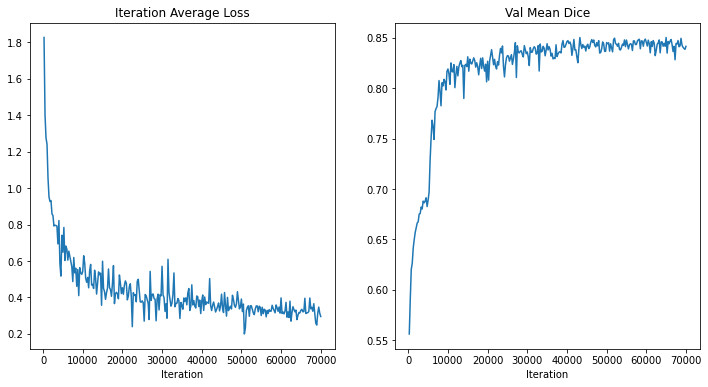

In [11]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Iteration Average Loss")
x = [eval_num * (i + 1) for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [eval_num * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.show()

### Check best model output with the input image and label

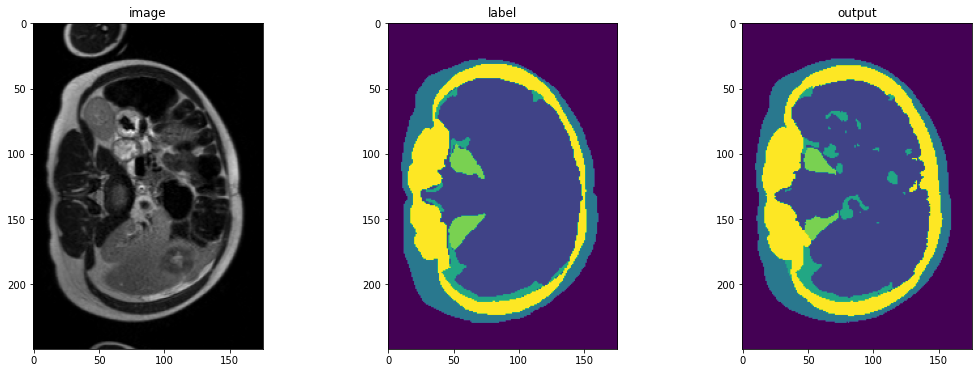

In [12]:
case_num = 0
model.load_state_dict(torch.load(os.path.join(root_dir, "TestMR09_unetrensemble_fold3.pth")))
model.eval()
with torch.no_grad():
    img_name = os.path.split(val_ds[case_num]["image_meta_dict"]["filename_or_obj"])[1]
    img = val_ds[case_num]["image"]
    label = val_ds[case_num]["label"]
    val_inputs = torch.unsqueeze(img, 1).to(device)
    val_labels = torch.unsqueeze(label, 1).to(device)
    val_outputs = sliding_window_inference(
        val_inputs, (96, 96, 16), 4, model, overlap=0.8
    )
    plt.figure("check", (18, 6))
    plt.subplot(1, 3, 1)
    plt.title("image")
    plt.imshow(val_inputs.cpu().numpy()[0, 0, :, :, 5], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.title("label")
    plt.imshow(val_labels.cpu().numpy()[0, 0, :, :, 5])
    plt.subplot(1, 3, 3)
    plt.title("output")
    plt.imshow(
        torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, 5]
    )
    plt.show()
    

### Inference on test images

In [6]:
import glob
from monai.data import Dataset
from monai.handlers.utils import from_engine
from monai.transforms import (
    AsDiscrete,
    AsDiscreted,
    EnsureChannelFirstd,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandCropByPosNegLabeld,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    EnsureTyped,
    EnsureType,
    Invertd,
)

test_images = sorted(
    glob.glob(os.path.join(root_dir, "../data/imagesTs/", "*.nii.gz")))

test_data = [{"image": image} for image in test_images]


test_org_transforms = Compose(
    [
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(
            1.5, 1.5, 4.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"], a_min=0, a_max=250,
            b_min=0.0, b_max=1.0, clip=False,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
        EnsureTyped(keys="image"),
    ]
)

test_org_ds = Dataset(
    data=test_data, transform=test_org_transforms)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=4)

post_transforms = Compose([
    EnsureTyped(keys="pred"),
    Invertd(
        keys="pred",
        transform=test_org_transforms,
        orig_keys="image",
        meta_keys="pred_meta_dict",
        orig_meta_keys="image_meta_dict",
        meta_key_postfix="meta_dict",
        nearest_interp=False,
        to_tensor=True,
    ),
    AsDiscreted(keys="pred", argmax=True, to_onehot=6),
    SaveImaged(keys="pred", meta_keys="pred_meta_dict", output_dir="./outMR09fold3", output_postfix="seg", resample=False, separate_folder=False),
])

Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]


2024-03-28 09:22:32,522 INFO image_writer.py:194 - writing: outMR09fold3/A002_v1_T2W_seg.nii.gz


Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]


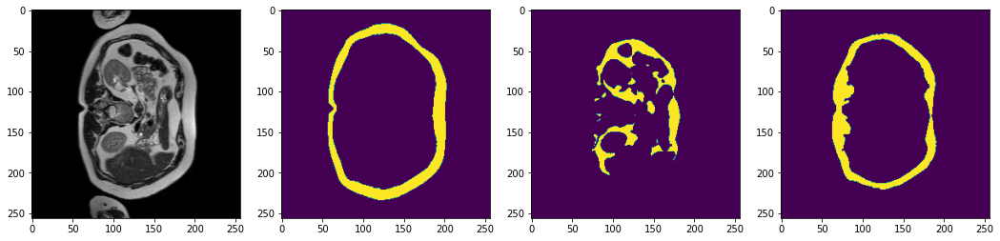

2024-03-28 09:22:34,897 INFO image_writer.py:194 - writing: outMR09fold3/A002_v2_T2W_seg.nii.gz


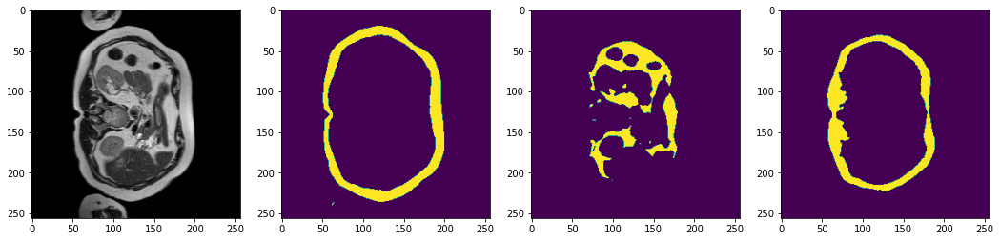

2024-03-28 09:22:37,367 INFO image_writer.py:194 - writing: outMR09fold3/A002_v3_T2W_seg.nii.gz


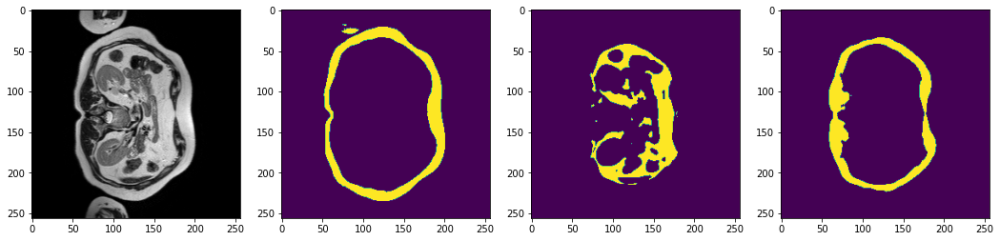

2024-03-28 09:22:39,671 INFO image_writer.py:194 - writing: outMR09fold3/A003_v1_T2W_seg.nii.gz


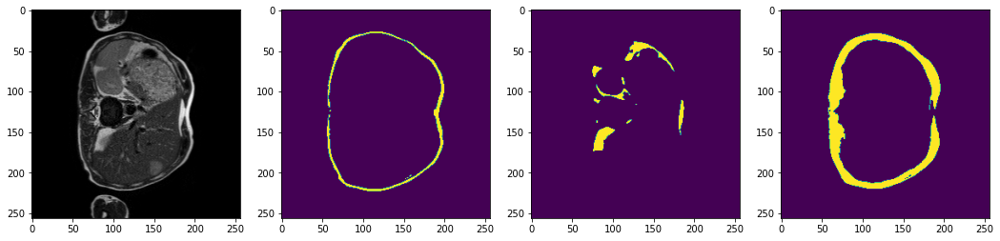

2024-03-28 09:22:42,088 INFO image_writer.py:194 - writing: outMR09fold3/A003_v2_T2W_seg.nii.gz


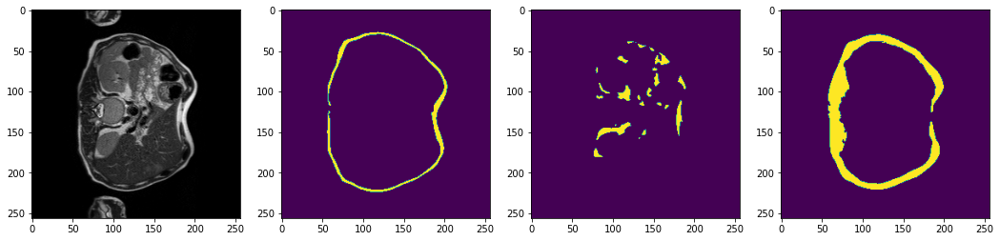

2024-03-28 09:22:44,384 INFO image_writer.py:194 - writing: outMR09fold3/A009_v1_T2W_seg.nii.gz


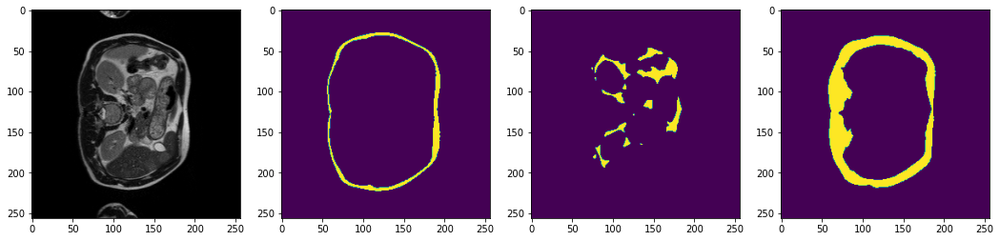

2024-03-28 09:22:46,741 INFO image_writer.py:194 - writing: outMR09fold3/A009_v2_T2W_seg.nii.gz


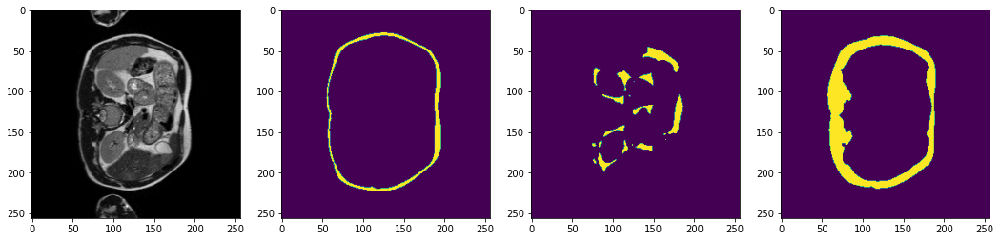

2024-03-28 09:22:49,082 INFO image_writer.py:194 - writing: outMR09fold3/A011_v1_T2W_seg.nii.gz


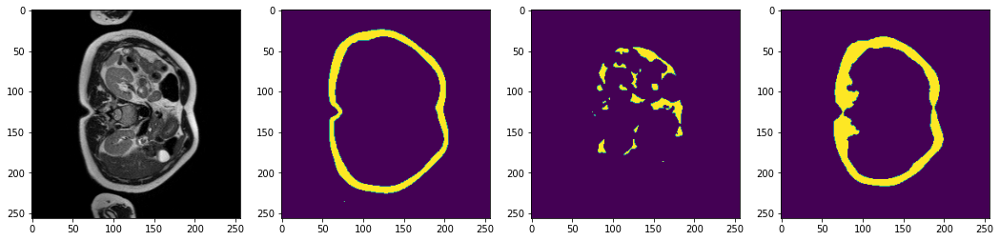

2024-03-28 09:22:51,408 INFO image_writer.py:194 - writing: outMR09fold3/A011_v2_T2W_seg.nii.gz


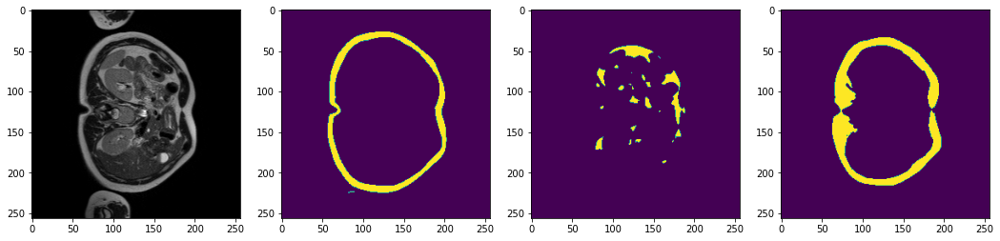

2024-03-28 09:22:53,897 INFO image_writer.py:194 - writing: outMR09fold3/A013_v1_T2W_seg.nii.gz


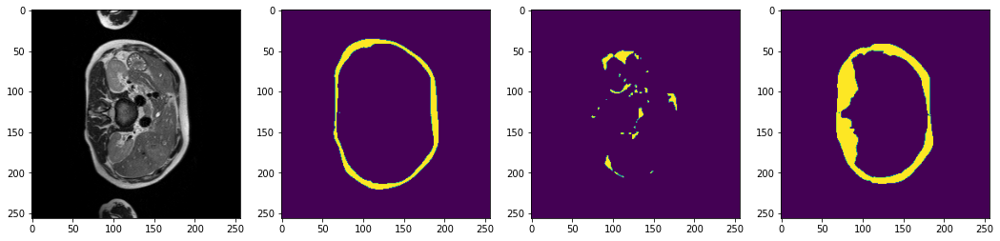

2024-03-28 09:22:55,952 INFO image_writer.py:194 - writing: outMR09fold3/A013_v2_T2W_seg.nii.gz


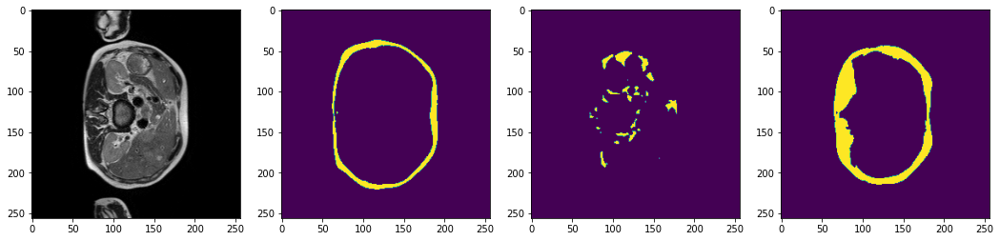

2024-03-28 09:22:58,267 INFO image_writer.py:194 - writing: outMR09fold3/A014_v1_T2W_seg.nii.gz


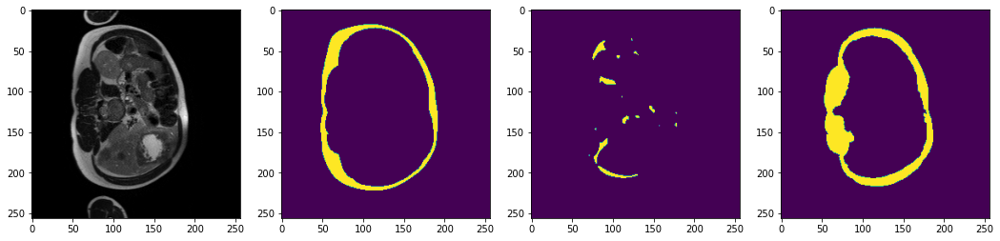

2024-03-28 09:23:00,574 INFO image_writer.py:194 - writing: outMR09fold3/A014_v2_T2W_seg.nii.gz


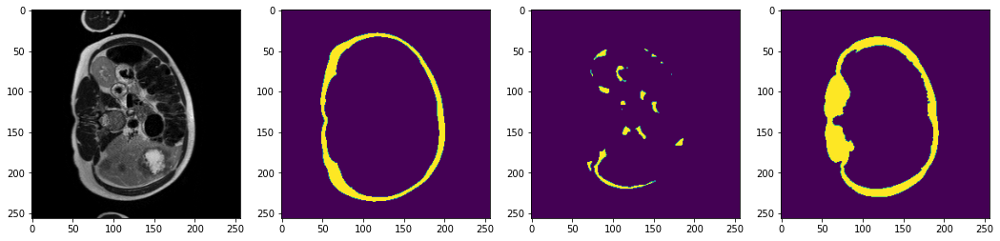

2024-03-28 09:23:02,892 INFO image_writer.py:194 - writing: outMR09fold3/A015_v1_T2W_seg.nii.gz


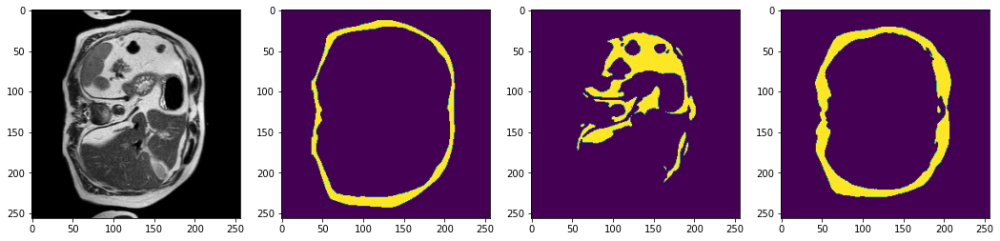

2024-03-28 09:23:05,216 INFO image_writer.py:194 - writing: outMR09fold3/A015_v2_T2W_seg.nii.gz


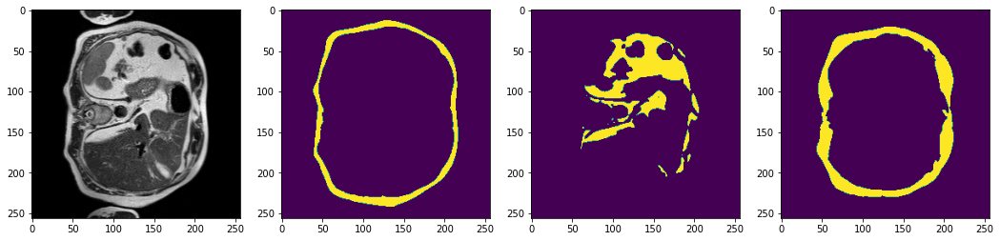

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 09:23:07,552 INFO image_writer.py:194 - writing: outMR09fold3/A016_v1_T2W_seg.nii.gz


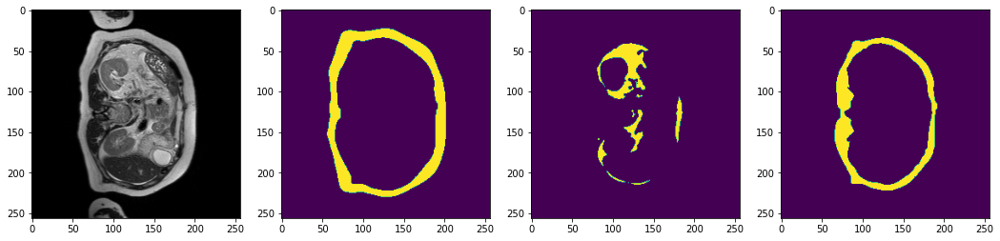

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 09:23:10,040 INFO image_writer.py:194 - writing: outMR09fold3/A016_v2_T2W_seg.nii.gz


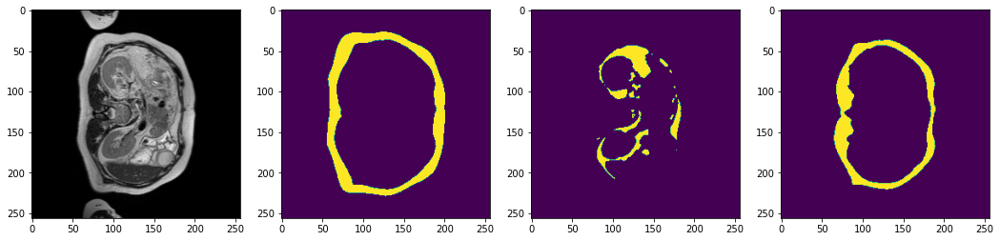

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 09:23:12,390 INFO image_writer.py:194 - writing: outMR09fold3/A017_v1_T2W_seg.nii.gz


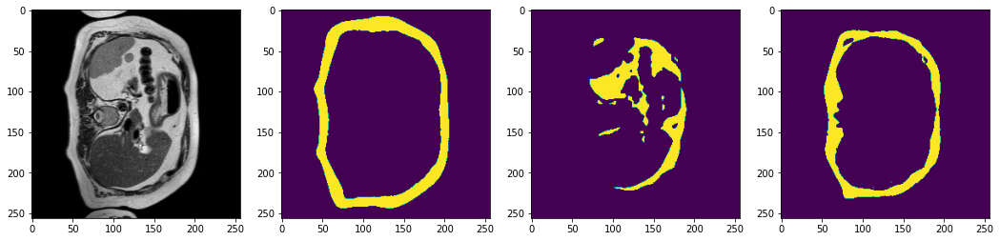

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 09:23:14,785 INFO image_writer.py:194 - writing: outMR09fold3/A017_v2_T2W_seg.nii.gz


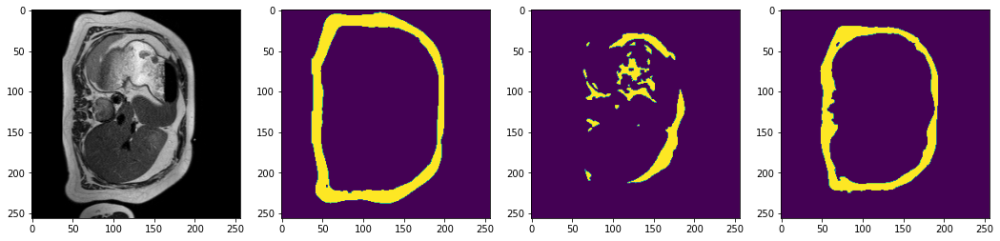

2024-03-28 09:23:17,160 INFO image_writer.py:194 - writing: outMR09fold3/A018_v1_T2W_seg.nii.gz


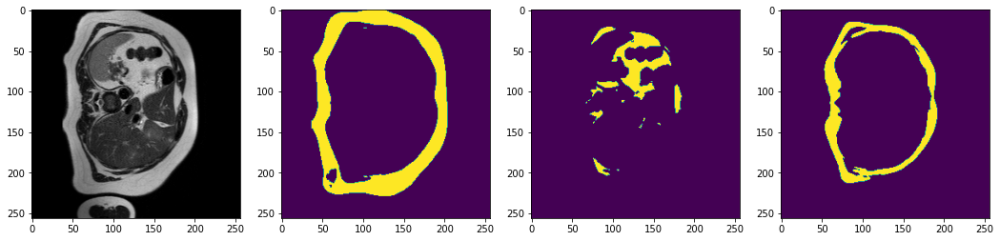

2024-03-28 09:23:19,561 INFO image_writer.py:194 - writing: outMR09fold3/A018_v2_T2W_seg.nii.gz


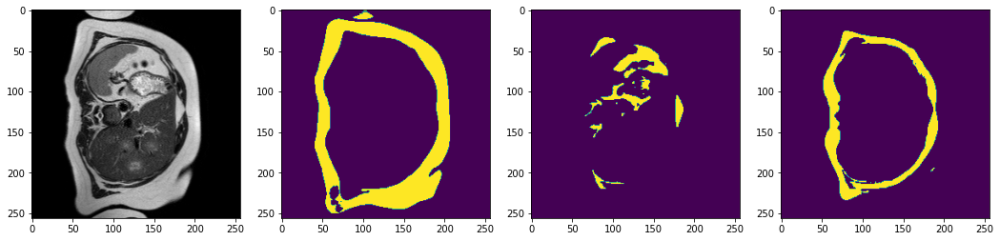

2024-03-28 09:23:21,991 INFO image_writer.py:194 - writing: outMR09fold3/A021_v1_T2W_seg.nii.gz


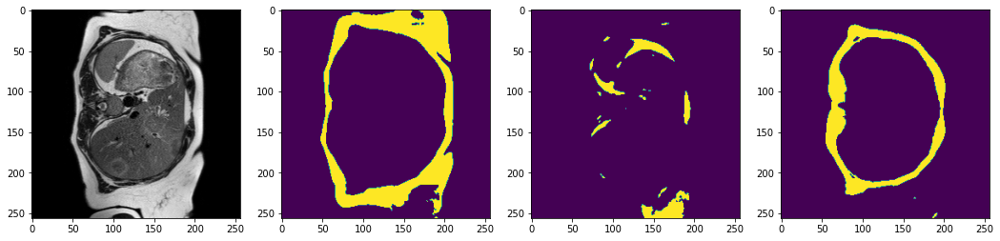

2024-03-28 09:23:24,353 INFO image_writer.py:194 - writing: outMR09fold3/A021_v2_T2W_seg.nii.gz


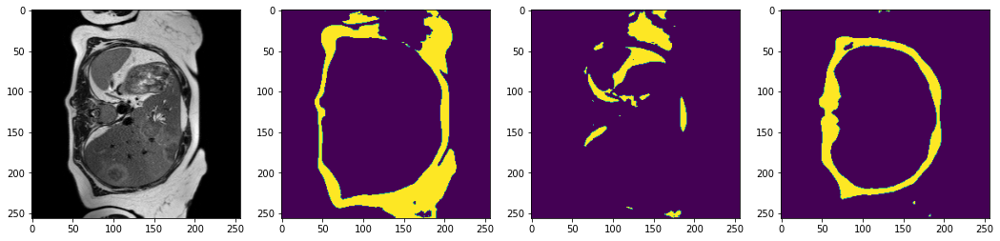

2024-03-28 09:23:30,143 INFO image_writer.py:194 - writing: outMR09fold3/A022_v1_T2W_seg.nii.gz


Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


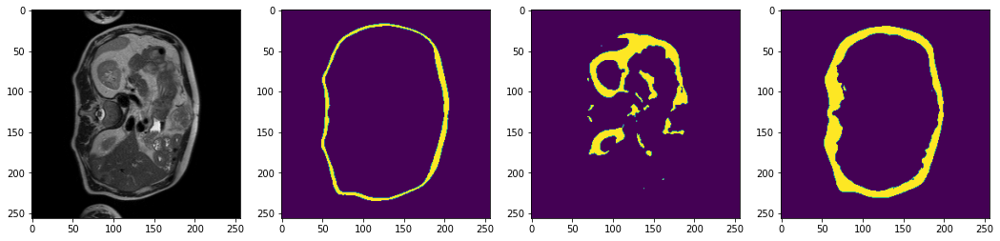

2024-03-28 09:23:35,763 INFO image_writer.py:194 - writing: outMR09fold3/A022_v2_T2W_seg.nii.gz


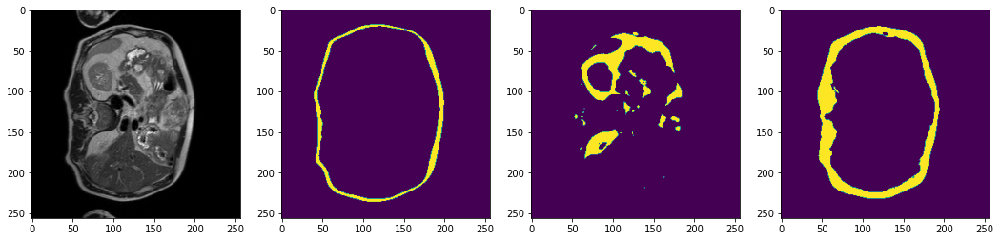

2024-03-28 09:23:41,453 INFO image_writer.py:194 - writing: outMR09fold3/A023_v1_T2W_seg.nii.gz


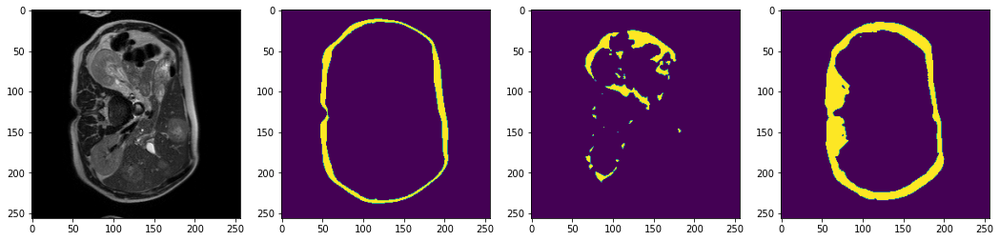

2024-03-28 09:23:47,127 INFO image_writer.py:194 - writing: outMR09fold3/A023_v2_T2W_seg.nii.gz


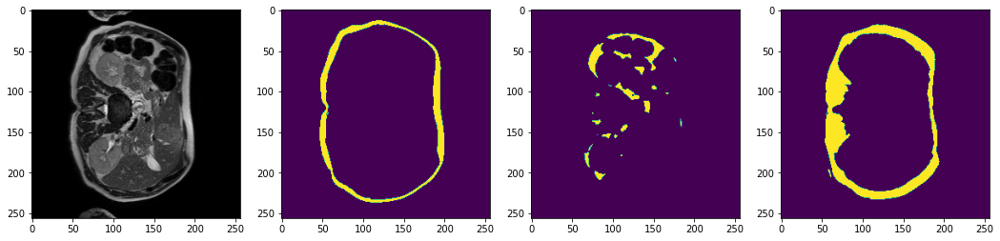

2024-03-28 09:23:49,510 INFO image_writer.py:194 - writing: outMR09fold3/A024_v1_T2W_seg.nii.gz


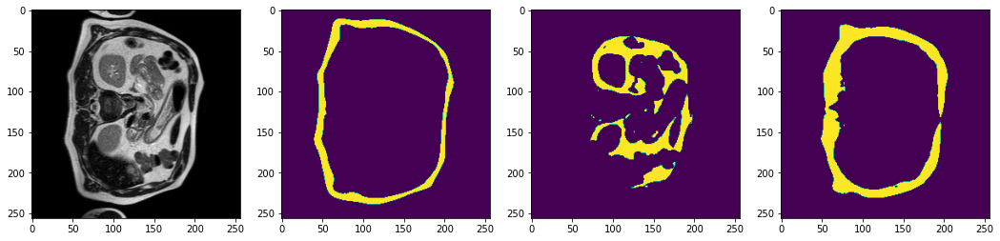

2024-03-28 09:23:51,876 INFO image_writer.py:194 - writing: outMR09fold3/A024_v2_T2W_seg.nii.gz


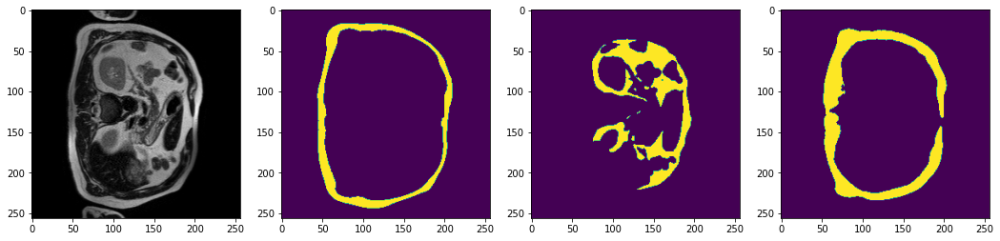

2024-03-28 09:23:57,588 INFO image_writer.py:194 - writing: outMR09fold3/A026_v1_T2W_seg.nii.gz


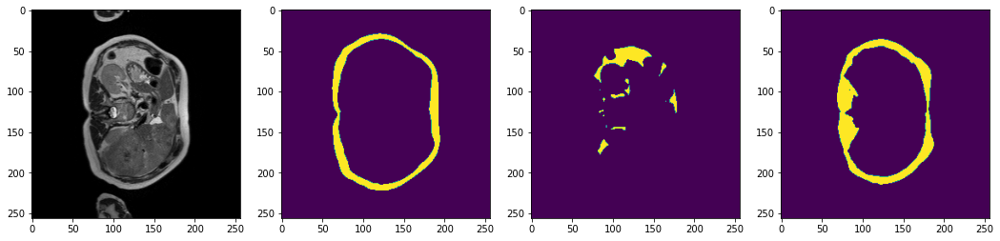

2024-03-28 09:24:03,406 INFO image_writer.py:194 - writing: outMR09fold3/A026_v2_T2W_seg.nii.gz


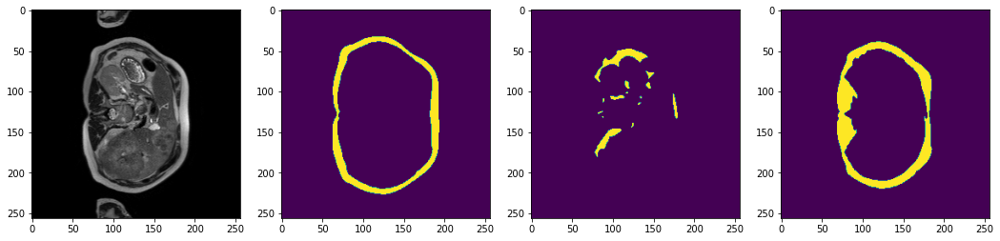

2024-03-28 09:24:05,884 INFO image_writer.py:194 - writing: outMR09fold3/A028_v1_T2W_seg.nii.gz


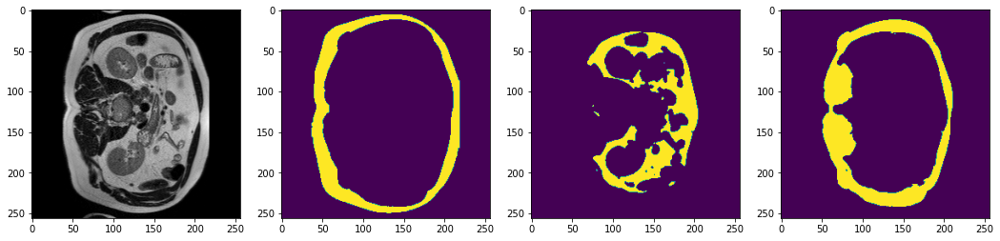

2024-03-28 09:24:08,347 INFO image_writer.py:194 - writing: outMR09fold3/A028_v2_T2W_seg.nii.gz


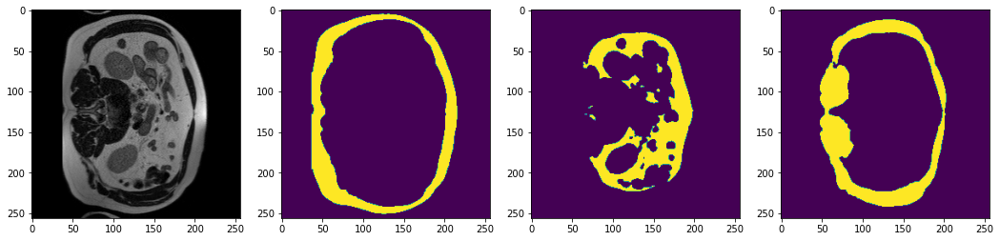

2024-03-28 09:24:10,821 INFO image_writer.py:194 - writing: outMR09fold3/A029_v1_T2W_seg.nii.gz


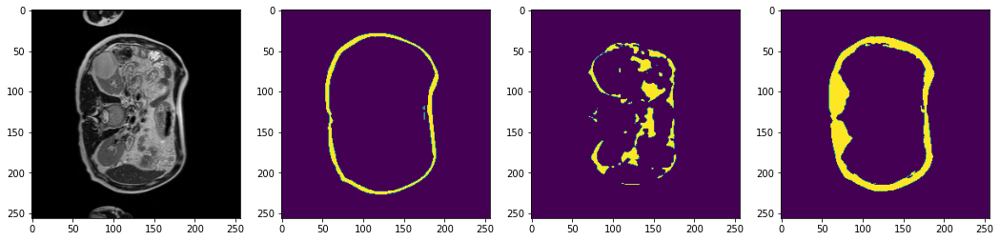

2024-03-28 09:24:12,988 INFO image_writer.py:194 - writing: outMR09fold3/A029_v2_T2W_seg.nii.gz


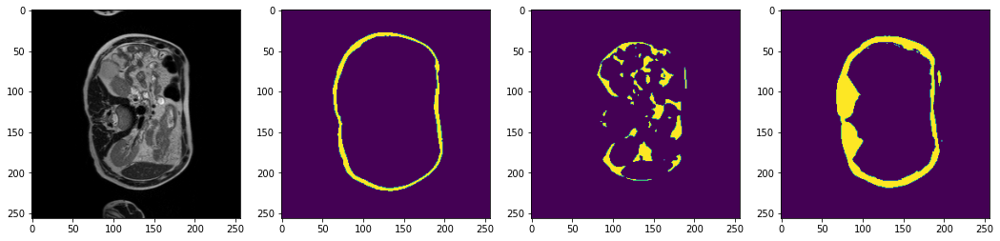

2024-03-28 09:24:15,360 INFO image_writer.py:194 - writing: outMR09fold3/A029_v3_T2W_seg.nii.gz


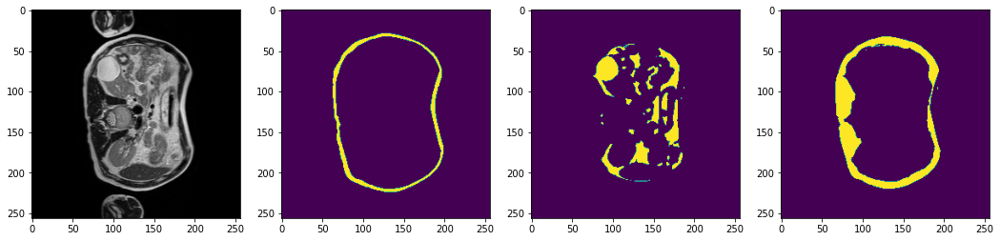

2024-03-28 09:24:17,498 INFO image_writer.py:194 - writing: outMR09fold3/A029_v4_T2W_seg.nii.gz


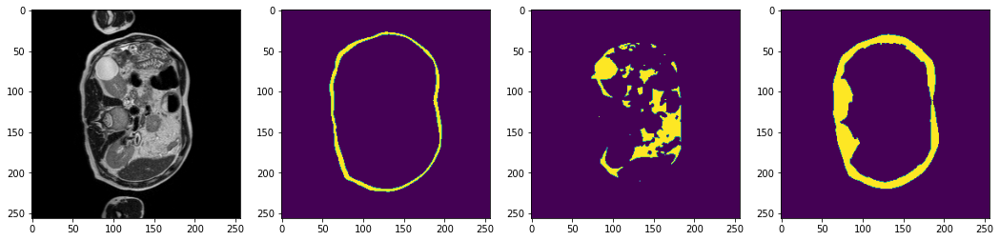

2024-03-28 09:24:19,938 INFO image_writer.py:194 - writing: outMR09fold3/A030_v1_T2W_seg.nii.gz


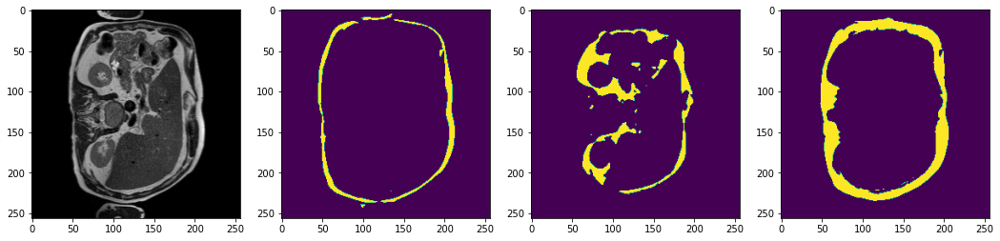

2024-03-28 09:24:22,511 INFO image_writer.py:194 - writing: outMR09fold3/A030_v2_T2W_seg.nii.gz


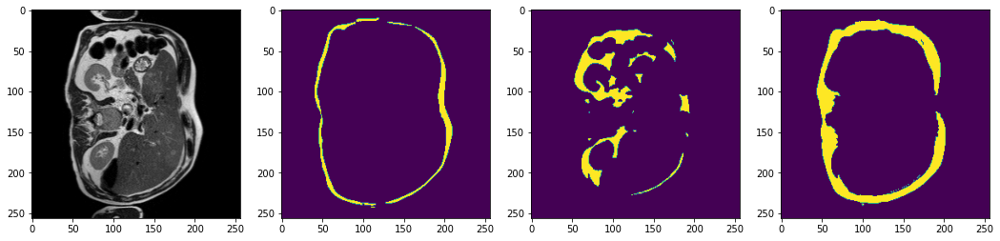

2024-03-28 09:24:24,723 INFO image_writer.py:194 - writing: outMR09fold3/A031_v1_T2W_seg.nii.gz


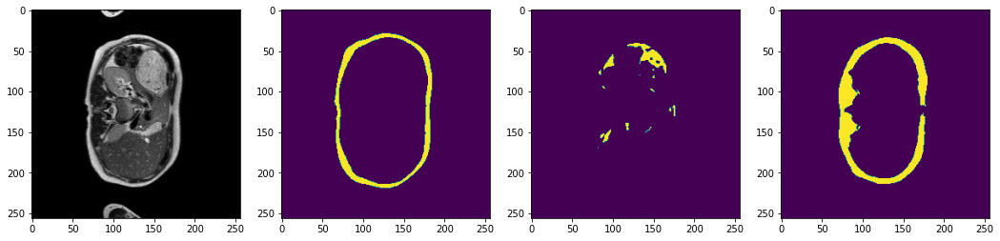

2024-03-28 09:24:26,845 INFO image_writer.py:194 - writing: outMR09fold3/A031_v2_T2W_seg.nii.gz


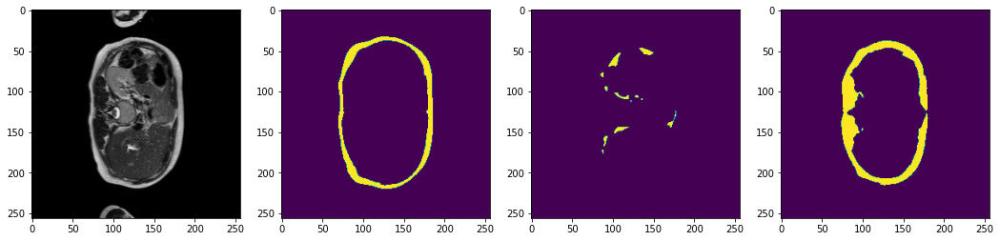

2024-03-28 09:24:32,590 INFO image_writer.py:194 - writing: outMR09fold3/A032_v1_T2W_seg.nii.gz


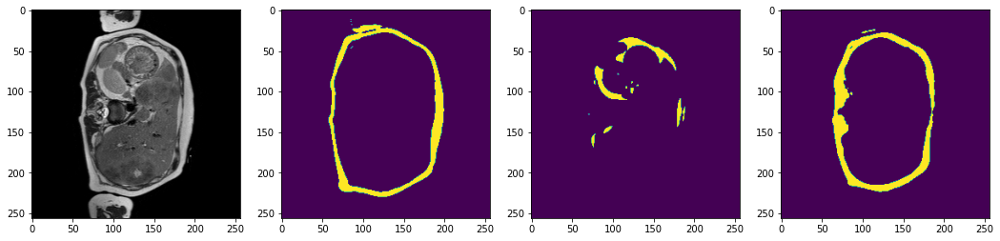

2024-03-28 09:24:38,310 INFO image_writer.py:194 - writing: outMR09fold3/A032_v2_T2W_seg.nii.gz


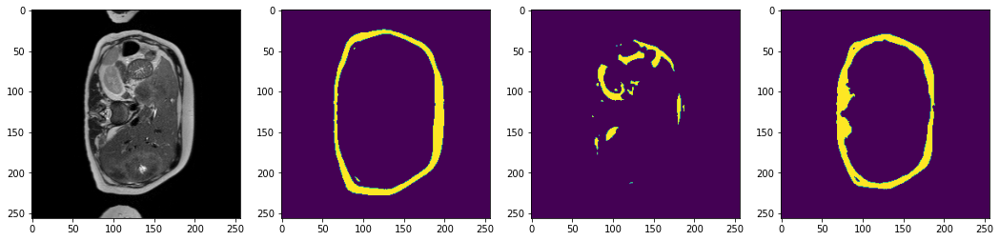

2024-03-28 09:24:44,064 INFO image_writer.py:194 - writing: outMR09fold3/A033_v1_T2W_seg.nii.gz


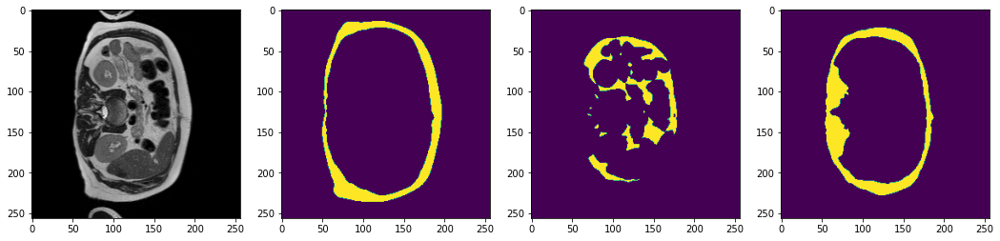

2024-03-28 09:24:49,845 INFO image_writer.py:194 - writing: outMR09fold3/A033_v2_T2W_seg.nii.gz


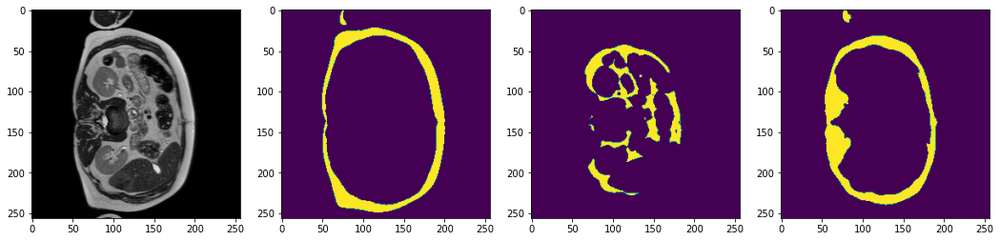

2024-03-28 09:24:55,763 INFO image_writer.py:194 - writing: outMR09fold3/A033_v3_T2W_seg.nii.gz


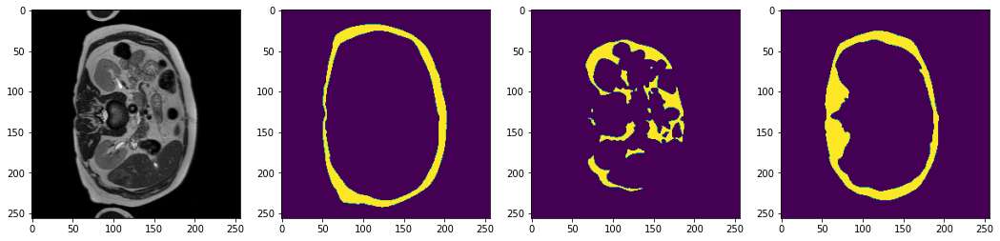

2024-03-28 09:25:01,553 INFO image_writer.py:194 - writing: outMR09fold3/A033_v4_T2W_seg.nii.gz


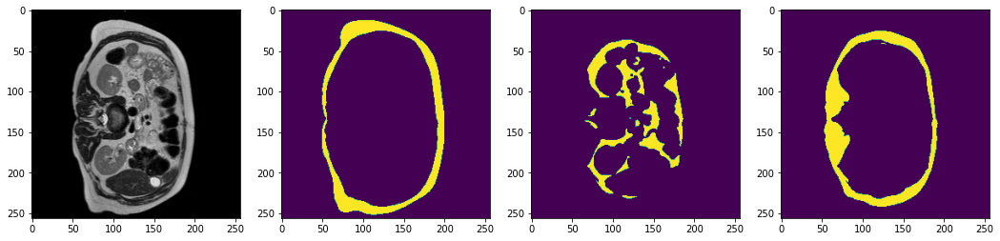

2024-03-28 09:25:07,381 INFO image_writer.py:194 - writing: outMR09fold3/A034_v1_T2W_seg.nii.gz


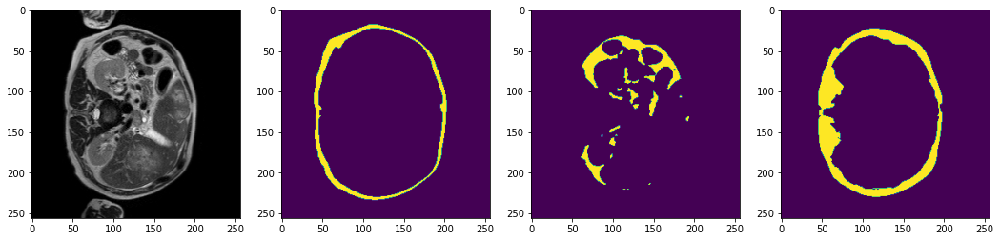

2024-03-28 09:25:13,150 INFO image_writer.py:194 - writing: outMR09fold3/A034_v2_T2W_seg.nii.gz


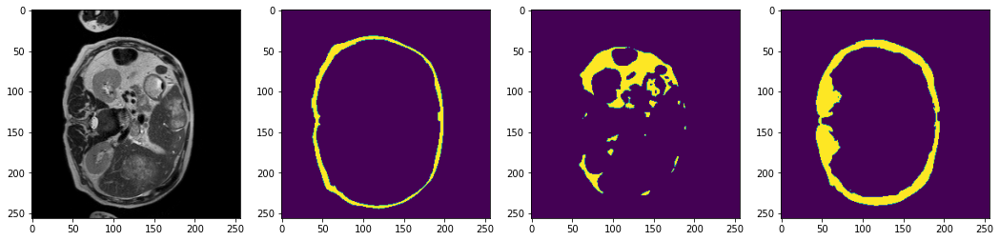

2024-03-28 09:25:18,958 INFO image_writer.py:194 - writing: outMR09fold3/A036_v1_T2W_seg.nii.gz


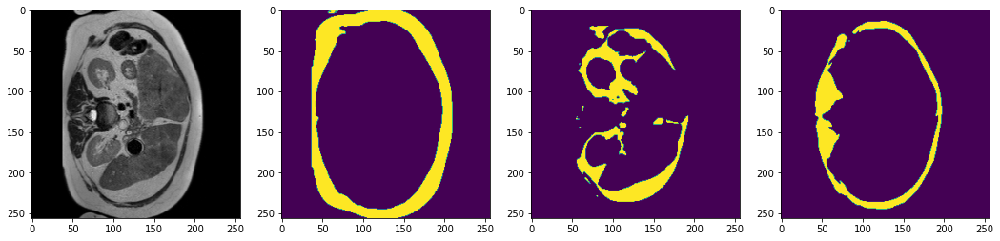

2024-03-28 09:25:24,745 INFO image_writer.py:194 - writing: outMR09fold3/A036_v2_T2W_seg.nii.gz


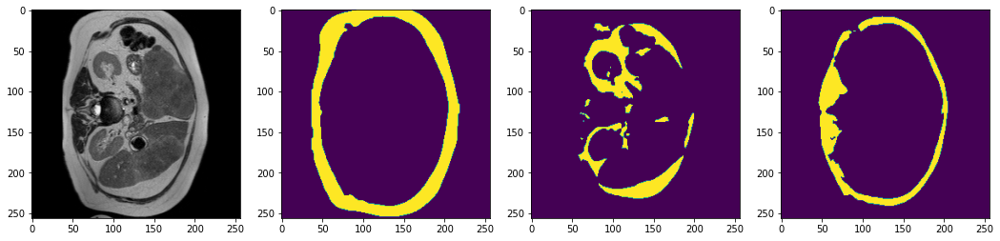

2024-03-28 09:25:29,710 INFO image_writer.py:194 - writing: outMR09fold3/A037_v1_T2W_seg.nii.gz


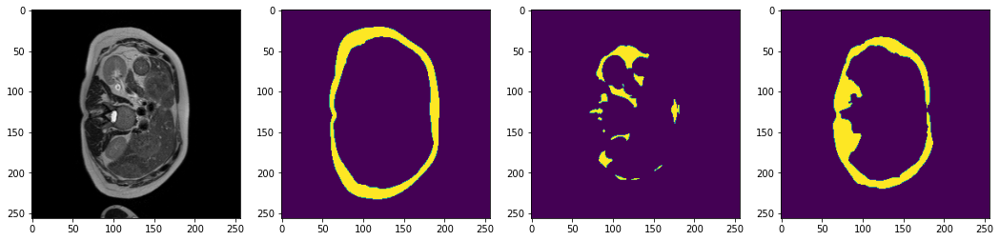

2024-03-28 09:25:35,654 INFO image_writer.py:194 - writing: outMR09fold3/A037_v2_T2W_seg.nii.gz


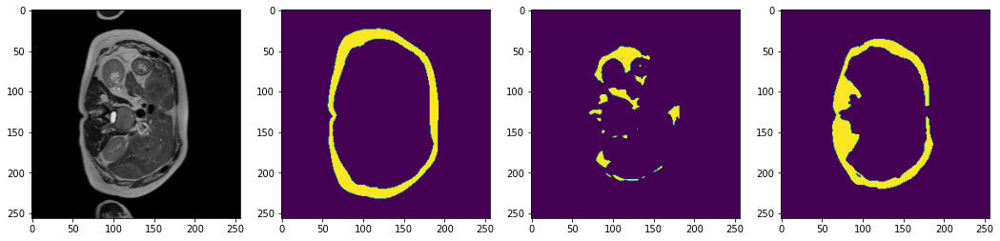

2024-03-28 09:25:38,045 INFO image_writer.py:194 - writing: outMR09fold3/A038_v1_T2W_seg.nii.gz


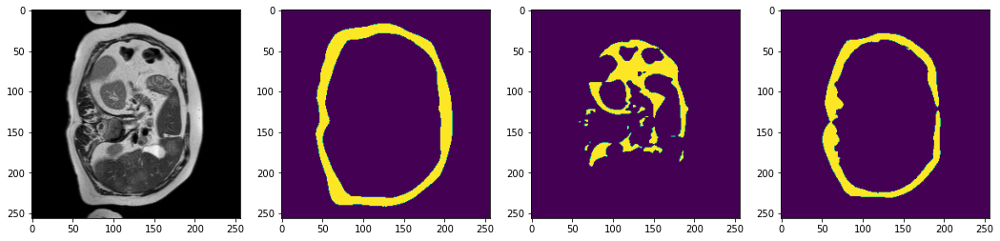

2024-03-28 09:25:40,463 INFO image_writer.py:194 - writing: outMR09fold3/A038_v2_T2W_seg.nii.gz


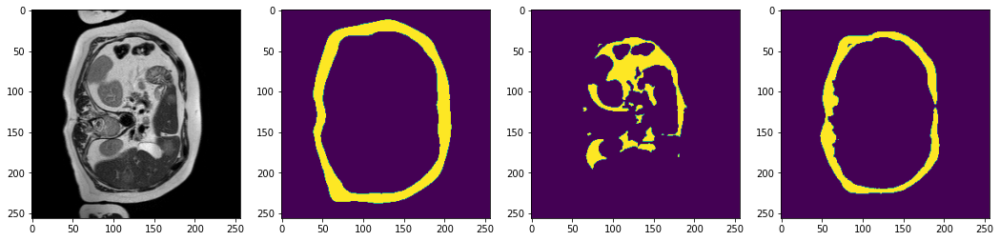

2024-03-28 09:25:42,588 INFO image_writer.py:194 - writing: outMR09fold3/A039_v1_T2W_seg.nii.gz


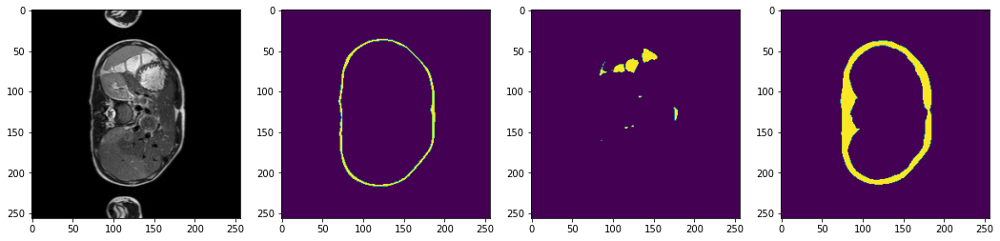

2024-03-28 09:25:44,439 INFO image_writer.py:194 - writing: outMR09fold3/A039_v2_T2W_seg.nii.gz


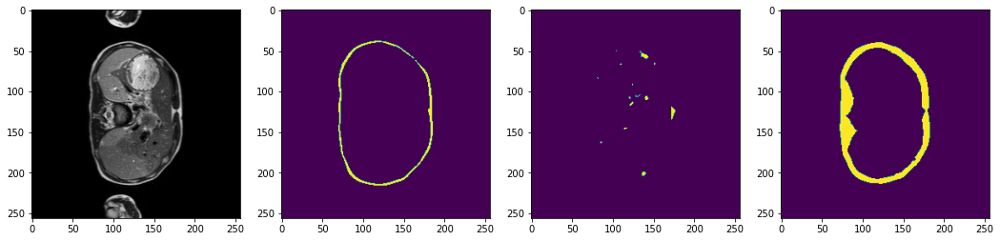

2024-03-28 09:25:50,287 INFO image_writer.py:194 - writing: outMR09fold3/A040_v1_T2W_seg.nii.gz


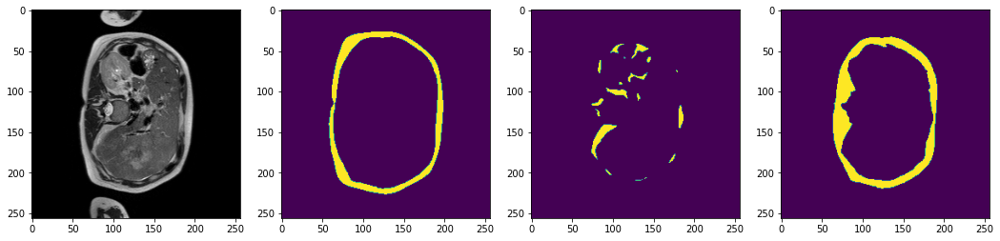

2024-03-28 09:25:56,099 INFO image_writer.py:194 - writing: outMR09fold3/A040_v2_T2W_seg.nii.gz


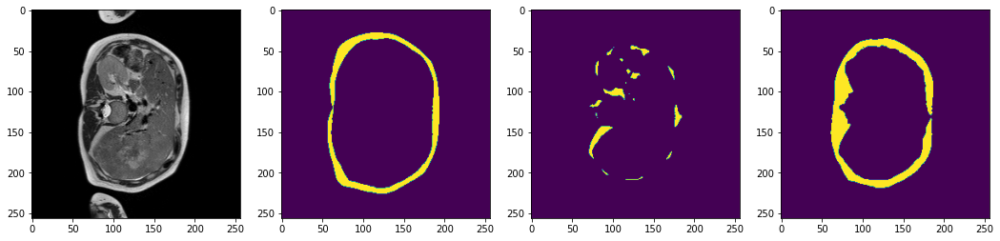

2024-03-28 09:25:58,577 INFO image_writer.py:194 - writing: outMR09fold3/A041_v1_T2W_seg.nii.gz


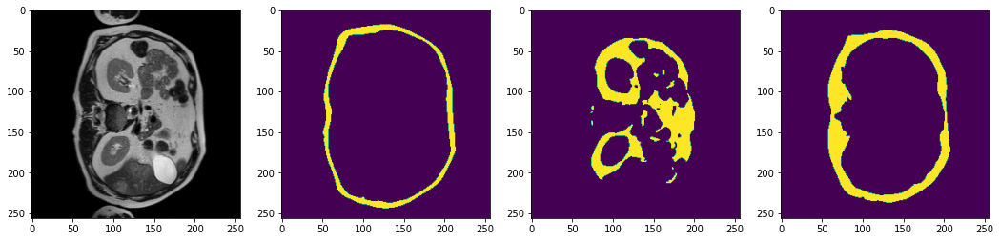

2024-03-28 09:26:01,133 INFO image_writer.py:194 - writing: outMR09fold3/A041_v2_T2W_seg.nii.gz


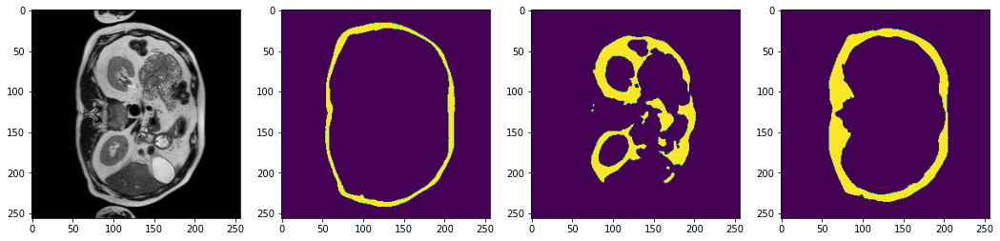

2024-03-28 09:26:06,910 INFO image_writer.py:194 - writing: outMR09fold3/A043_v1_T2W_seg.nii.gz


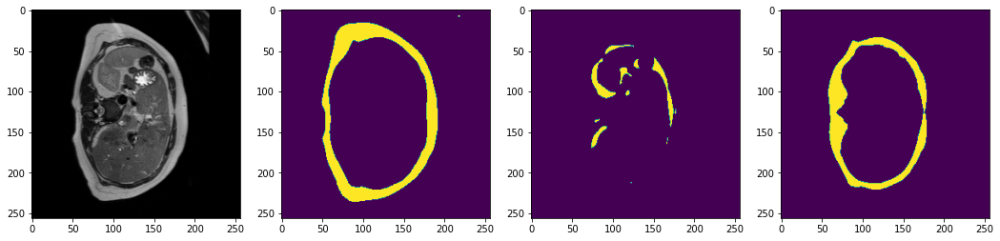

2024-03-28 09:26:12,703 INFO image_writer.py:194 - writing: outMR09fold3/A043_v2_T2W_seg.nii.gz


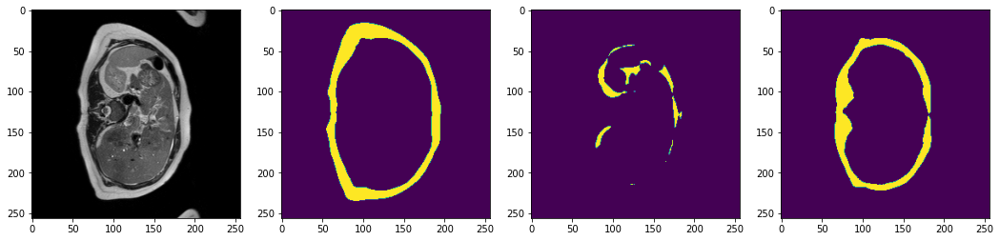

2024-03-28 09:26:18,470 INFO image_writer.py:194 - writing: outMR09fold3/A043_v5_T2W_seg.nii.gz


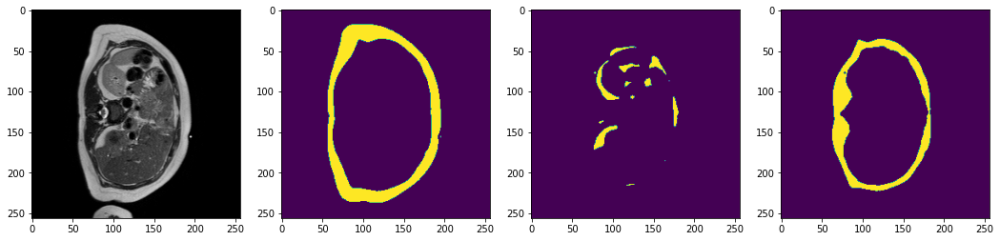

2024-03-28 09:26:20,836 INFO image_writer.py:194 - writing: outMR09fold3/A046_v1_T2W_seg.nii.gz


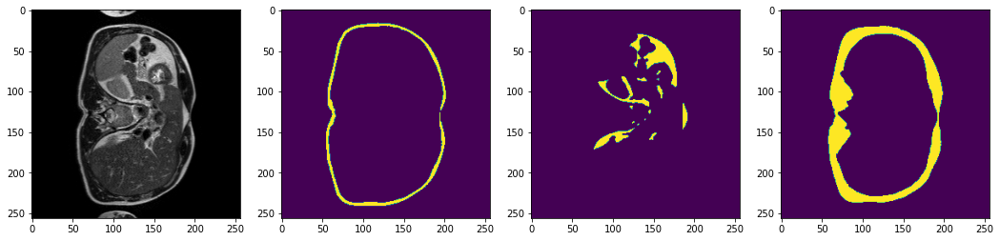

2024-03-28 09:26:23,235 INFO image_writer.py:194 - writing: outMR09fold3/A046_v2_T2W_seg.nii.gz


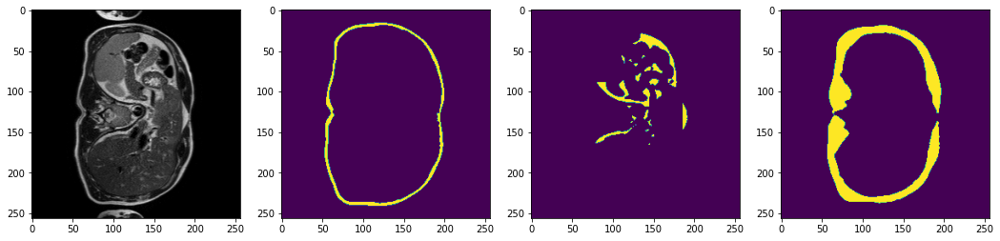

2024-03-28 09:26:25,622 INFO image_writer.py:194 - writing: outMR09fold3/A047_v1_T2W_seg.nii.gz


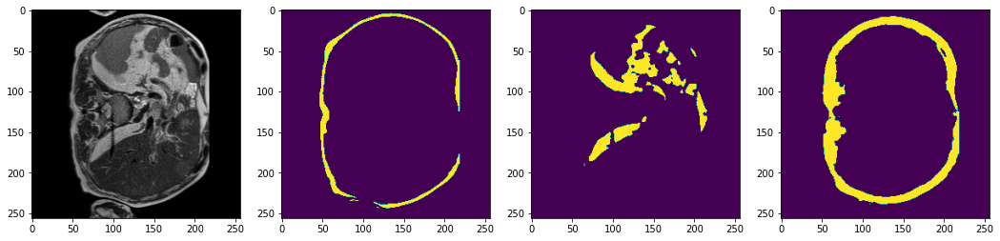

2024-03-28 09:26:28,235 INFO image_writer.py:194 - writing: outMR09fold3/A047_v2_T2W_seg.nii.gz


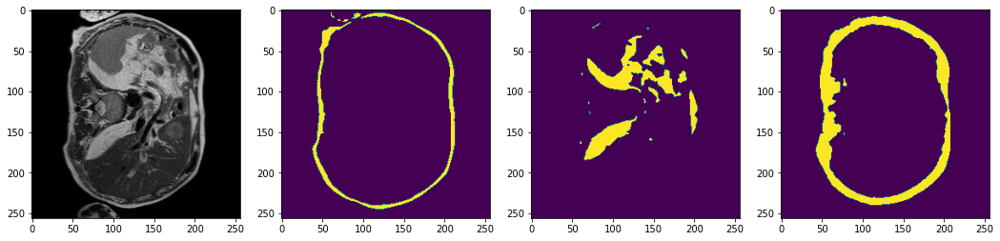

2024-03-28 09:26:30,677 INFO image_writer.py:194 - writing: outMR09fold3/A048_v1_T2W_seg.nii.gz


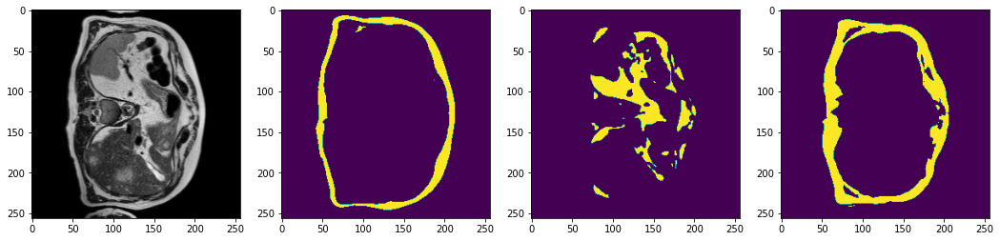

2024-03-28 09:26:33,095 INFO image_writer.py:194 - writing: outMR09fold3/A048_v2_T2W_seg.nii.gz


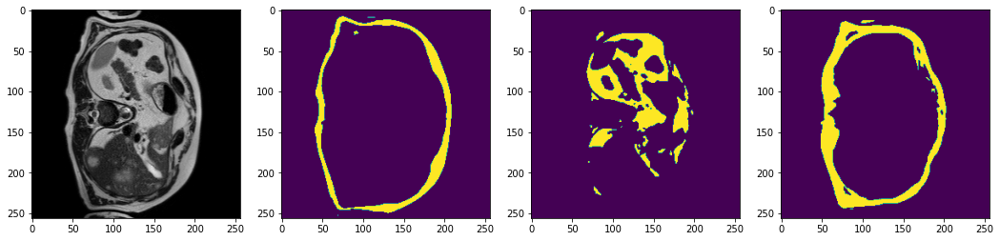

2024-03-28 09:26:35,543 INFO image_writer.py:194 - writing: outMR09fold3/A049_v1_T2W_seg.nii.gz


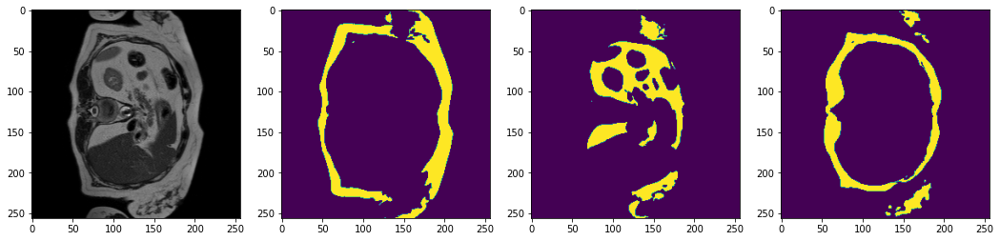

2024-03-28 09:26:37,992 INFO image_writer.py:194 - writing: outMR09fold3/A049_v2_T2W_seg.nii.gz


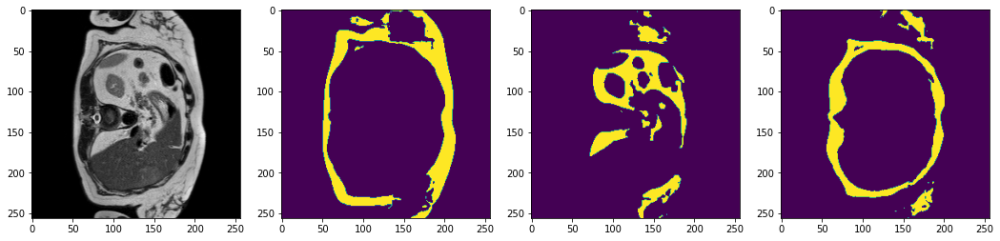

2024-03-28 09:26:40,506 INFO image_writer.py:194 - writing: outMR09fold3/A050_v1_T2W_seg.nii.gz


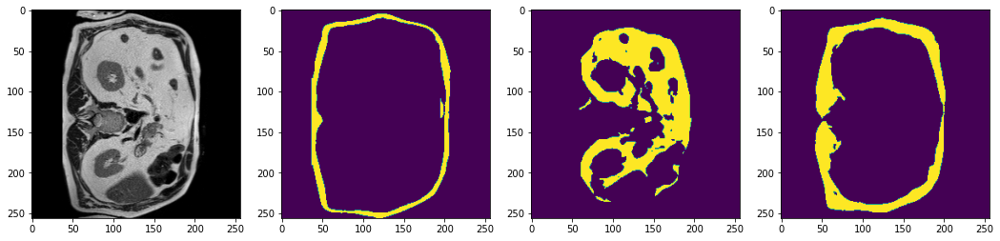

2024-03-28 09:26:42,910 INFO image_writer.py:194 - writing: outMR09fold3/A050_v2_T2W_seg.nii.gz


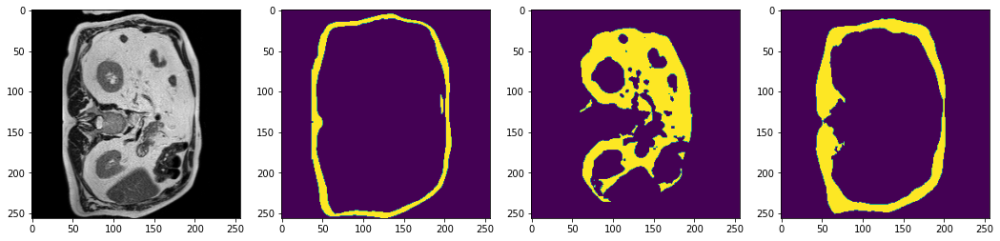

2024-03-28 09:26:45,489 INFO image_writer.py:194 - writing: outMR09fold3/A051_v1_T2W_seg.nii.gz


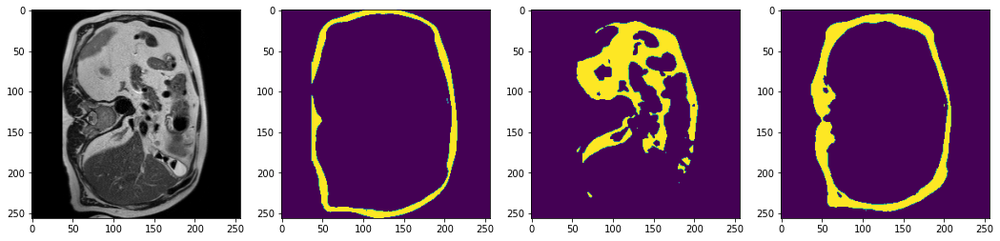

2024-03-28 09:26:47,908 INFO image_writer.py:194 - writing: outMR09fold3/A051_v2_T2W_seg.nii.gz


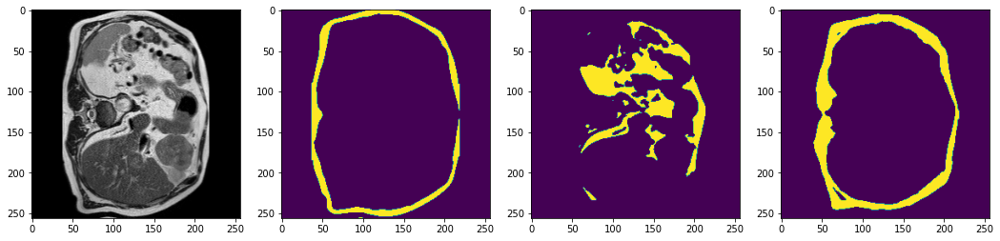

2024-03-28 09:26:53,717 INFO image_writer.py:194 - writing: outMR09fold3/A052_v1_T2W_seg.nii.gz


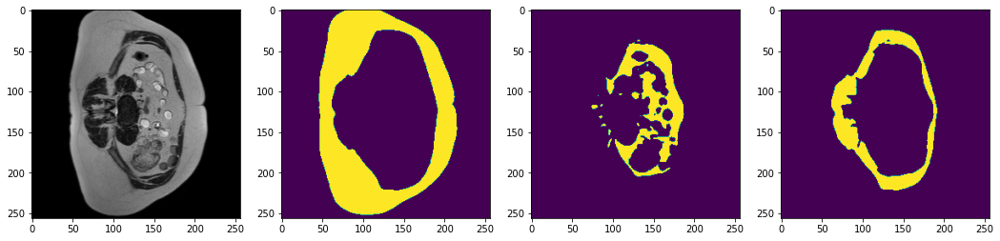

2024-03-28 09:26:59,573 INFO image_writer.py:194 - writing: outMR09fold3/A052_v2_T2W_seg.nii.gz


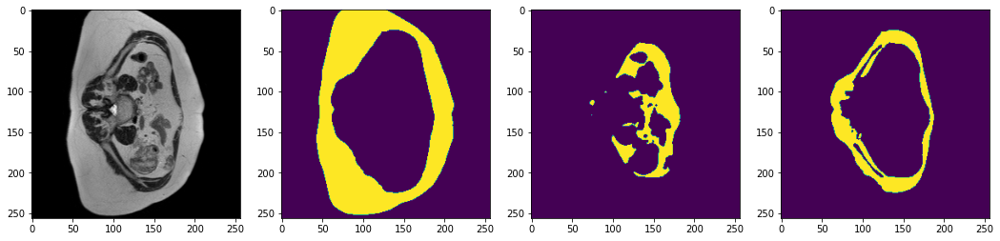

2024-03-28 09:27:01,983 INFO image_writer.py:194 - writing: outMR09fold3/A055_v1_T2W_seg.nii.gz


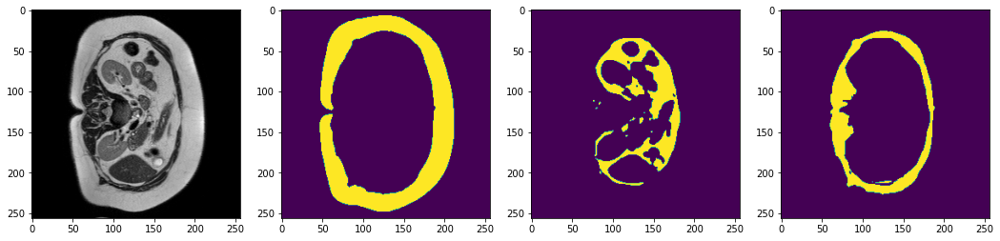

2024-03-28 09:27:04,379 INFO image_writer.py:194 - writing: outMR09fold3/A055_v2_T2W_seg.nii.gz


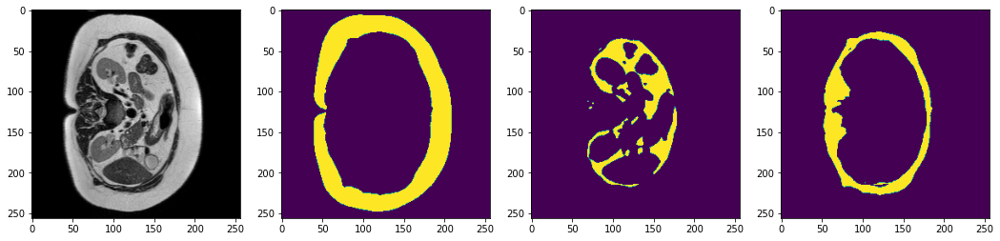

2024-03-28 09:27:06,781 INFO image_writer.py:194 - writing: outMR09fold3/A056_v1_T2W_seg.nii.gz


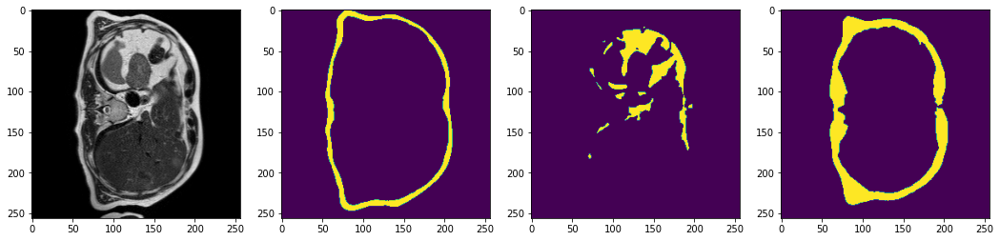

2024-03-28 09:27:09,347 INFO image_writer.py:194 - writing: outMR09fold3/A056_v2_T2W_seg.nii.gz


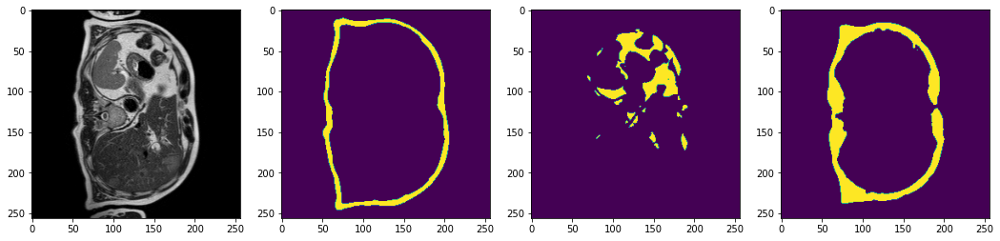

2024-03-28 09:27:11,755 INFO image_writer.py:194 - writing: outMR09fold3/A057_v1_T2W_seg.nii.gz


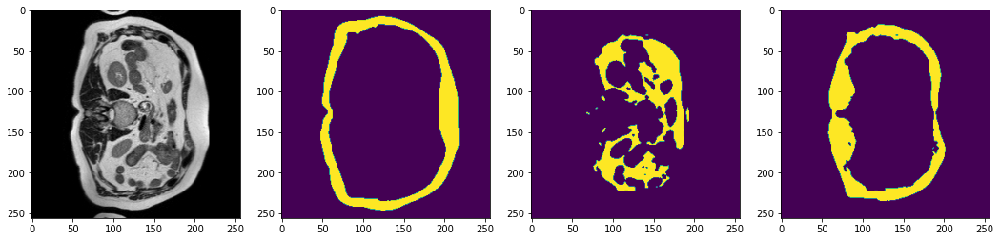

2024-03-28 09:27:14,161 INFO image_writer.py:194 - writing: outMR09fold3/A057_v2_T2W_seg.nii.gz


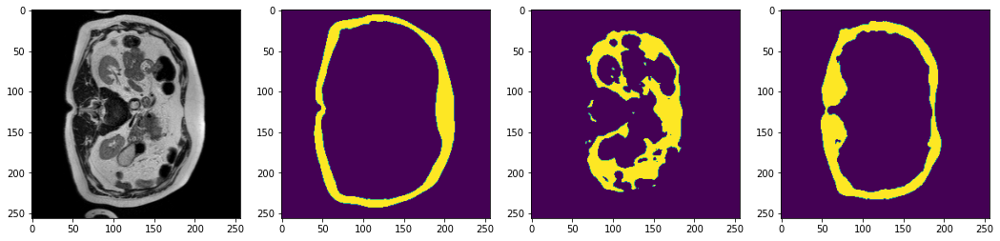

2024-03-28 09:27:20,054 INFO image_writer.py:194 - writing: outMR09fold3/A061_v1_T2W_seg.nii.gz


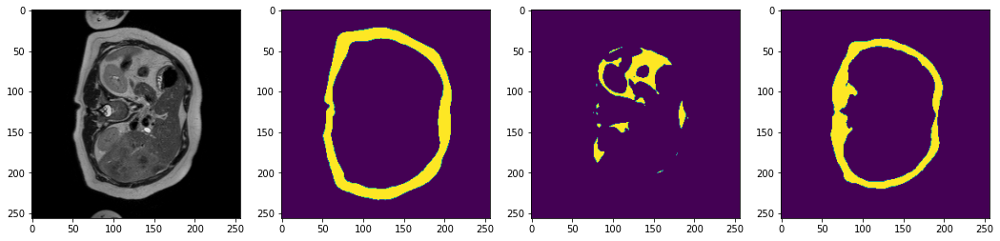

2024-03-28 09:27:25,870 INFO image_writer.py:194 - writing: outMR09fold3/A061_v2_T2W_seg.nii.gz


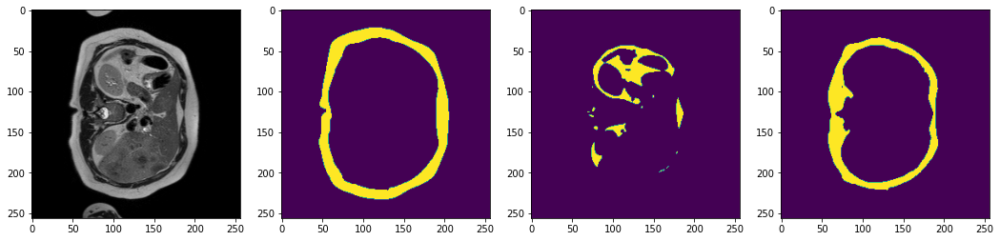

2024-03-28 09:27:28,015 INFO image_writer.py:194 - writing: outMR09fold3/A062_v1_T2W_seg.nii.gz


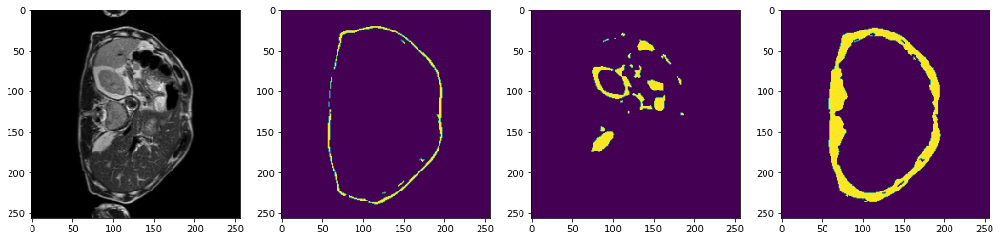

2024-03-28 09:27:30,172 INFO image_writer.py:194 - writing: outMR09fold3/A062_v2_T2W_seg.nii.gz


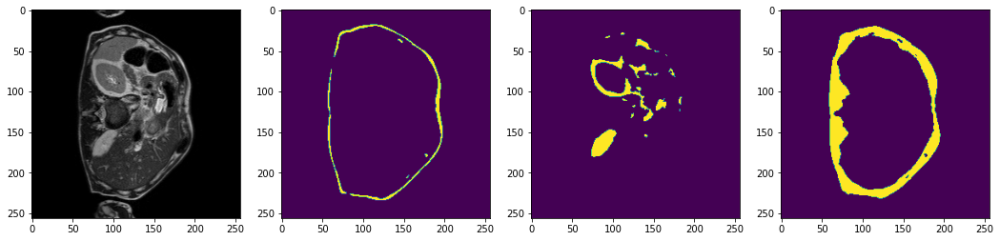

2024-03-28 09:27:32,776 INFO image_writer.py:194 - writing: outMR09fold3/A063_v1_T2W_seg.nii.gz


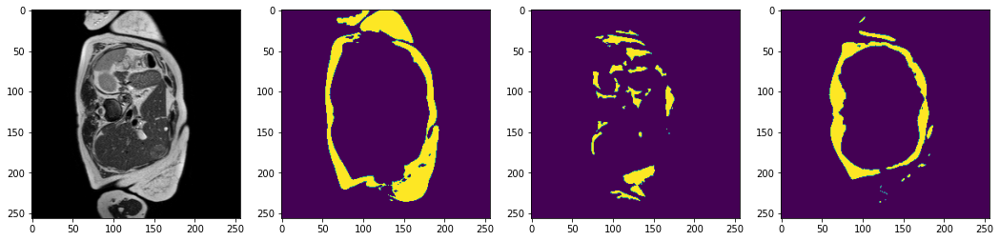

2024-03-28 09:27:35,161 INFO image_writer.py:194 - writing: outMR09fold3/A063_v2_T2W_seg.nii.gz


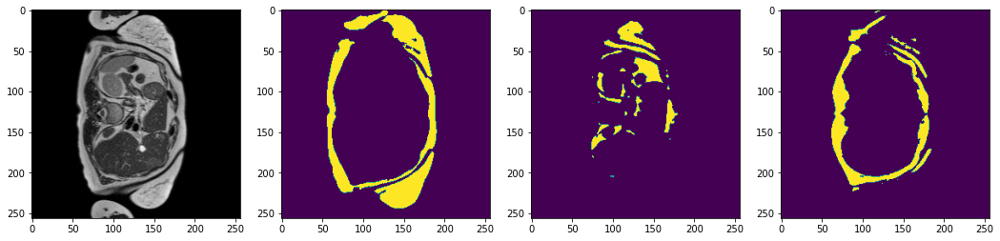

2024-03-28 09:27:37,574 INFO image_writer.py:194 - writing: outMR09fold3/A064_v1_T2W_seg.nii.gz


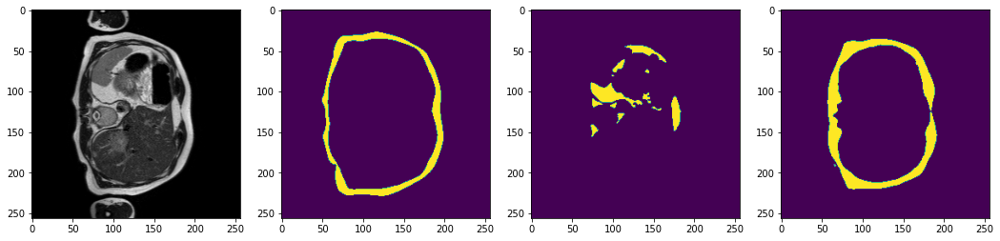

2024-03-28 09:27:39,968 INFO image_writer.py:194 - writing: outMR09fold3/A064_v2_T2W_seg.nii.gz


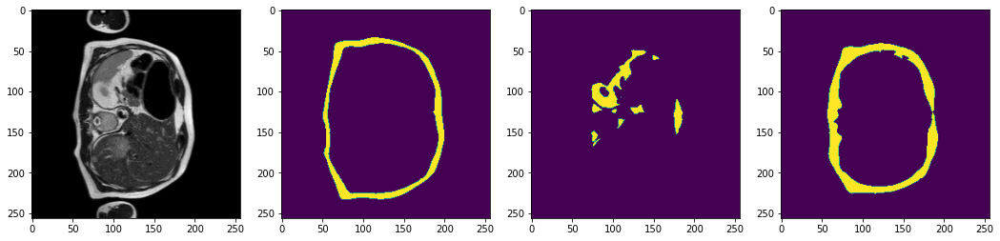

2024-03-28 09:27:42,377 INFO image_writer.py:194 - writing: outMR09fold3/A066_v1_T2W_seg.nii.gz


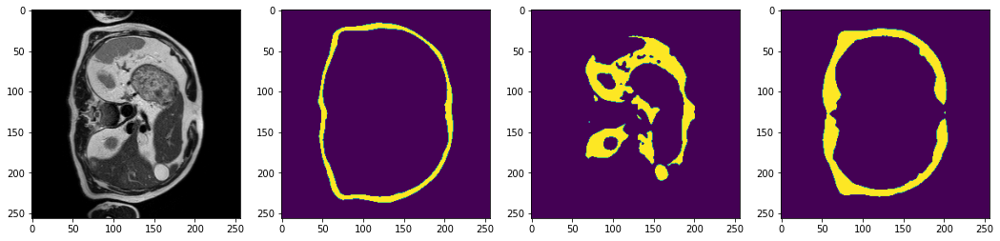

2024-03-28 09:27:44,821 INFO image_writer.py:194 - writing: outMR09fold3/A066_v2_T2W_seg.nii.gz


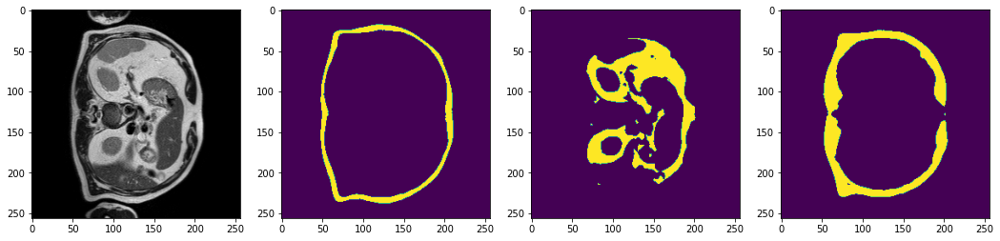

2024-03-28 09:27:47,261 INFO image_writer.py:194 - writing: outMR09fold3/A067_v1_T2W_seg.nii.gz


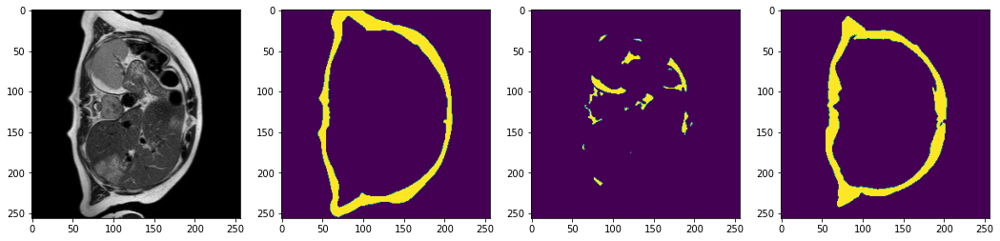

2024-03-28 09:27:49,876 INFO image_writer.py:194 - writing: outMR09fold3/A067_v2_T2W_seg.nii.gz


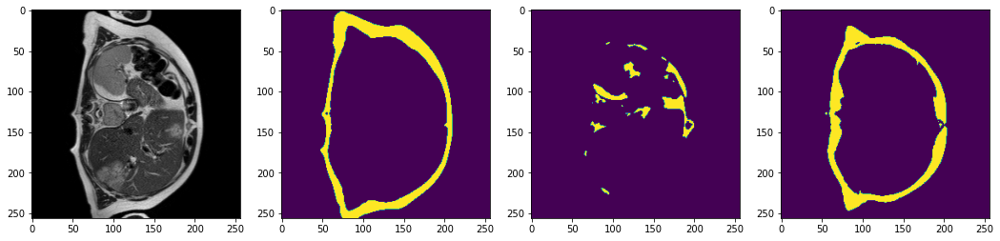

2024-03-28 09:27:51,884 INFO image_writer.py:194 - writing: outMR09fold3/A068_v1_T2W_seg.nii.gz


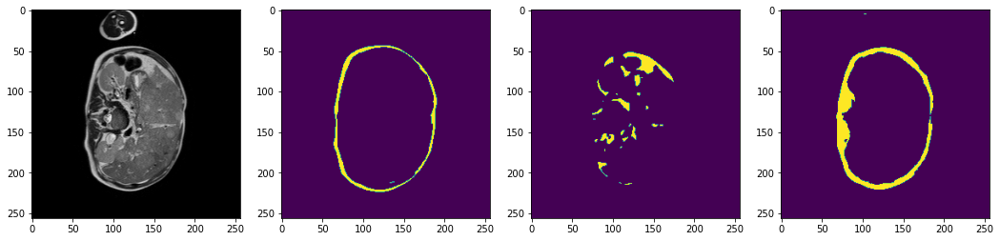

2024-03-28 09:27:54,017 INFO image_writer.py:194 - writing: outMR09fold3/A068_v2_T2W_seg.nii.gz


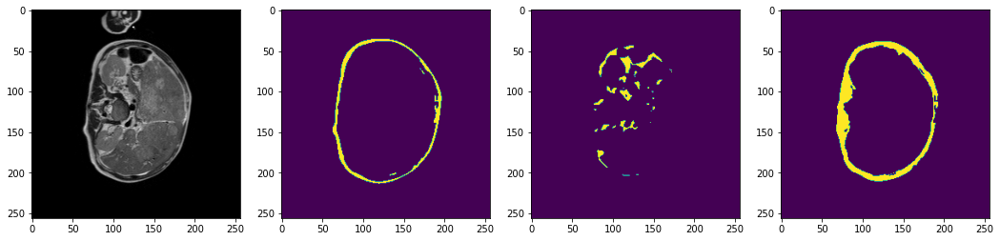

2024-03-28 09:27:58,978 INFO image_writer.py:194 - writing: outMR09fold3/A071_v1_T2W_seg.nii.gz


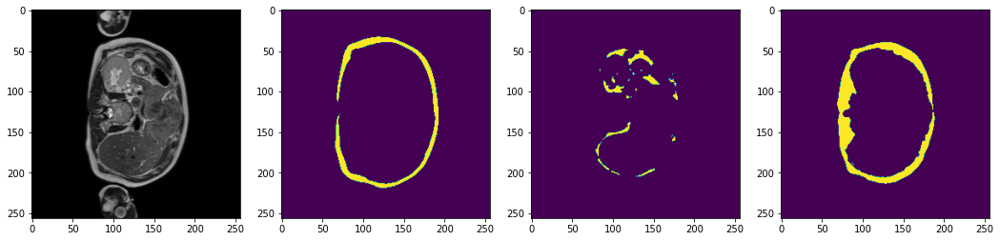

2024-03-28 09:28:03,950 INFO image_writer.py:194 - writing: outMR09fold3/A071_v2_T2W_seg.nii.gz


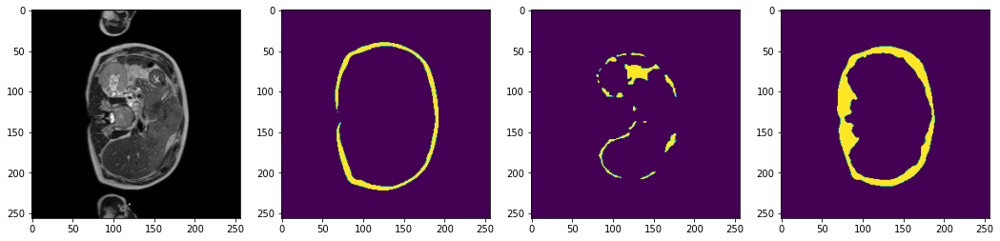

2024-03-28 09:28:09,002 INFO image_writer.py:194 - writing: outMR09fold3/A074_v1_T2W_seg.nii.gz


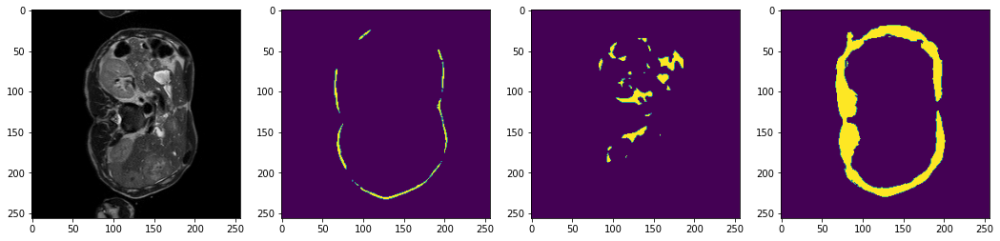

2024-03-28 09:28:14,992 INFO image_writer.py:194 - writing: outMR09fold3/A074_v2_T2W_seg.nii.gz


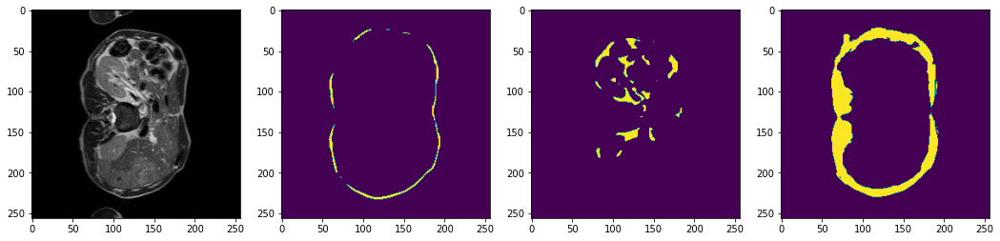

2024-03-28 09:28:17,312 INFO image_writer.py:194 - writing: outMR09fold3/A076_v1_T2W_seg.nii.gz


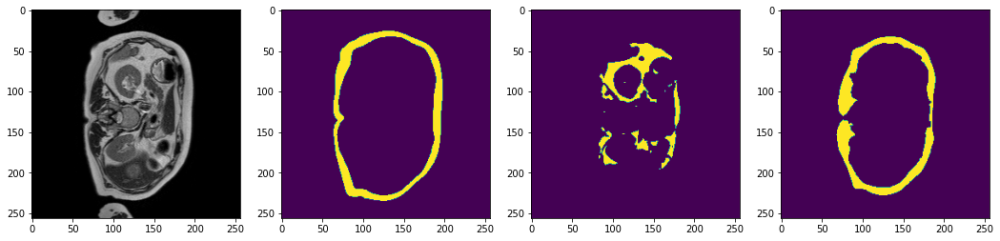

2024-03-28 09:28:19,778 INFO image_writer.py:194 - writing: outMR09fold3/A076_v2_T2W_seg.nii.gz


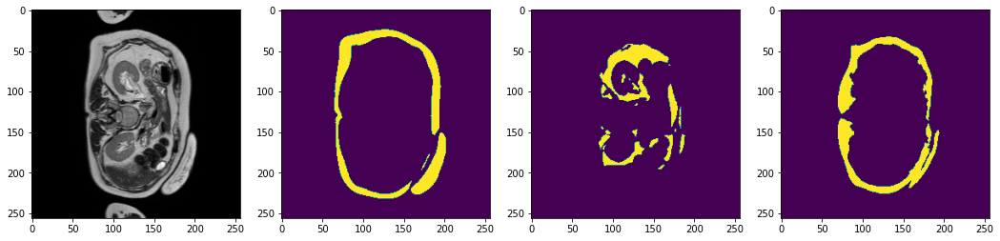

In [7]:
from monai.transforms import LoadImage
loader = LoadImage()

model.load_state_dict(torch.load(
    os.path.join(root_dir, "TestMR09_unetrensemble_fold3.pth")))
model.eval()

with torch.no_grad():
    for test_data in test_org_loader:
        test_inputs = test_data["image"].to(device)
        roi_size = (96, 96, 16)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(
            test_inputs, roi_size, sw_batch_size, model, overlap=0.8)

        test_data = [post_transforms(i) for i in decollate_batch(test_data)]

#         # uncomment the following lines to visualize the predicted results
        test_output = from_engine(["pred"])(test_data)

        original_image = loader(test_data[0]["image_meta_dict"]["filename_or_obj"])[0]

        plt.figure("check", (18, 6))
        plt.subplot(1, 4, 1)
        plt.imshow(original_image[:, :, 8], cmap="gray")
        plt.subplot(1, 4, 2)
        plt.imshow(test_output[0].detach().cpu()[2, :, :, 8])
        plt.subplot(1, 4, 3)
        plt.imshow(test_output[0].detach().cpu()[3, :, :, 8])
        plt.subplot(1, 4, 4)
        plt.imshow(test_output[0].detach().cpu()[5, :, :, 8])
        plt.show()

In [12]:
!tar -cvzf outMR09fold4.tar.gz outMR09fold4

outMR09fold4/
outMR09fold4/A026_v1_T2W_seg.nii.gz
outMR09fold4/A011_v2_T2W_seg.nii.gz
outMR09fold4/A003_v1_T2W_seg.nii.gz
outMR09fold4/A034_v1_T2W_seg.nii.gz
outMR09fold4/A017_v1_T2W_seg.nii.gz
outMR09fold4/A057_v2_T2W_seg.nii.gz
outMR09fold4/A031_v1_T2W_seg.nii.gz
outMR09fold4/A033_v3_T2W_seg.nii.gz
outMR09fold4/A011_v1_T2W_seg.nii.gz
outMR09fold4/A071_v2_T2W_seg.nii.gz
outMR09fold4/A048_v2_T2W_seg.nii.gz
outMR09fold4/A028_v1_T2W_seg.nii.gz
outMR09fold4/A068_v1_T2W_seg.nii.gz
outMR09fold4/A032_v2_T2W_seg.nii.gz
outMR09fold4/A071_v1_T2W_seg.nii.gz
outMR09fold4/A049_v1_T2W_seg.nii.gz
outMR09fold4/A061_v2_T2W_seg.nii.gz
outMR09fold4/A026_v2_T2W_seg.nii.gz
outMR09fold4/A043_v2_T2W_seg.nii.gz
outMR09fold4/A050_v1_T2W_seg.nii.gz
outMR09fold4/A063_v1_T2W_seg.nii.gz
outMR09fold4/A046_v2_T2W_seg.nii.gz
outMR09fold4/A041_v2_T2W_seg.nii.gz
outMR09fold4/A003_v2_T2W_seg.nii.gz
outMR09fold4/A033_v1_T2W_seg.nii.gz
outMR09fold4/A043_v5_T2W_seg.nii.gz
outMR09fold4/A014_v2_T2W_seg.nii.gz
outMR09fold4/A